In [1]:
#TODO apply standard scalar to everything?
#TODO compare with results using calphad instead of ML
#TODO compare with specific cherry-picked test data instead of random test/train split
#TODO incorporate more data in database
#TODO make matrix of ~10,000 test data
#TODO is it possible to ask the program to approximate the confidence of each prediction?

#TODO print duplicate experimental data which are dropped when merging
#Add RMSE and nRMSE stats?

In [2]:
!pip install jarvis-tools lightgbm
!pip install -U jarvis-tools

In [3]:
import os
os.environ["OMP_NUM_THREADS"] = "2" # export OMP_NUM_THREADS=2 to remove k-cluster warning

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from jarvis.ai.descriptors.elemental import get_element_fraction_desc
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from jarvis.ai.pkgs.utils import mean_absolute_deviation
from jarvis.ai.descriptors.cfid import get_chem_only_descriptors
%matplotlib inline
plt.rcParams.update({'font.size': 18})
import math
from jarvis.core.specie import Specie
import statistics
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import VotingRegressor
import seaborn as sns
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.cluster import AgglomerativeClustering

!pip install plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

from mpl_toolkits.axes_grid1 import host_subplot
import mpl_toolkits.axisartist as AA
import matplotlib.pyplot as plt

In [1]:
#setting which displays all columns and 10 rows
pd.set_option("display.max_rows", 30, "display.max_columns", None)

#import datafile as dataframe "df"
df=pd.read_csv('ML-Co-input_FinalProgram.csv',encoding='ANSI')

#import new compositions as dataframe "newcomp_df"http://localhost:8888/notebooks/OneDrive%20-%20Northwestern%20University/_FromNUBox/Dunand%20Research/Machine%20Learning/Final%20ML%20program/Final%20ML%20program-UpdatedDatabase.ipynb#
newcomp_df=pd.read_csv('new_prediction_composition.csv', encoding='ANSI')


#make new dataframe "data" which converts df's unrecognized values into 0
data = df.fillna(0)

#put empty solvus, solidus, YS, etc values as "unknown". Blank values become 0
newcomp_df= newcomp_df.fillna(0)
#replaced the "unknown" string values as N/A values, which are replaced later
newcomp_df.replace('unknown',np.NaN, inplace=True)


#drop columns from data
data = data.drop(columns=['Paper','ID-curve', 'Notes', 'IndexRef','name'])
# data = data.drop(columns=['Diff Temperature [C]','Mole fraction of FCC_L12#2','Molar volume of FCC_L12#2 [m3/mol]',
#                           'DI(FCC_L12,Al,Al,Co)', 'DI(FCC_L12,Cr,Cr,Co)', 'DI(FCC_L12,Hf,Hf,Co)', 'DI(FCC_L12,Mo,Mo,Co)',
#                          'DI(FCC_L12,Nb,Nb,Co)','DI(FCC_L12,Ni,Ni,Co)','DI(FCC_L12,Re,Re,Co)', 'DI(FCC_L12,Si,Si,Co)',
#                          'DI(FCC_L12,Ta,Ta,Co)', 'DI(FCC_L12,Ti,Ti,Co)', 'DI(FCC_L12,V,V,Co)', 'DI(FCC_L12,W,W,Co)',
#                           'DI(FCC_L12,Zr,Zr,Co)'])
# data = data.drop(columns=['Mole fraction of FCC_L12','Molar volume of FCC_L12 [m3/mol]','Lattice parameter FCC (m)',
#                           'Lattice Parameter L12 (m)','Lattice Misfit ','TCNI11 solidus', 'TCNI11 liquidus',
#                          'Deff = sum DI'])

magpie_names = get_chem_only_descriptors(formula=data.Shortname[0], source="magpie")[1]
data[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in data['Shortname']]

magpie_names = get_chem_only_descriptors(formula=newcomp_df.Shortname[0], source="magpie")[1]
newcomp_df[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in newcomp_df['Shortname']]

#dataframe "input_df" now contains all information the model will see. This will be run in the function
input_df0 = data.copy()

print("current data is:")
print(data)

print("new data is:")
print(newcomp_df)

NameError: name 'pd' is not defined

In [5]:
def predict_ML_misfit(input_df, misfit_file, plot_histogram, test_fit, plot_fit, plot_importance, random_state1, random_state2):

    #input_df is the creep data, which the model will "test"
    #misfit_file is the string for data including misfit, which the model will train
    #test_fit is bool, if True it will split misfit into test/training
    #plot_fit is bool, if True it graphs the fit
    #plot_importance is bool, if True it will plot importance
    #random_state allows control of random variables, in most cases it will be random_state=0

    #when defined as a function, these will be given in the call
    #input_df = input_df
    #misfit_file = 'ML-Co-input_lattice misfit.csv'
    #test_fit = True
    #plot_importance = True
    #random_state1 = 0
    #random_state2 = 0

    #takes the location of the misfit file and makes a dataframe "misfit_data"
    misfit_data = pd.read_csv(misfit_file, encoding='ANSI')


    #converts unrecognized values into 0
    misfit_data = misfit_data.fillna(0)

    #drop columns from data
    misfit_data = misfit_data.drop(columns=['Index', 'Name','Paper', 'Notes'])
    
    #for now drop aging temperature, later can spend time seeing if it helps
    misfit_data = misfit_data.drop(columns=['Aging Temp C'])
    #misfit_data = misfit_data.drop(columns=["g lattice parameter", "g' lattice parameter (nm)"])


    magpie_names = get_chem_only_descriptors(formula=misfit_data.Shortname[0], source="magpie")[1]
    misfit_data[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in misfit_data['Shortname']]

    #split data into test and training if desired
    #"random_state" is defined in the function so that this number can be cycled if desired 

    #scaled = false because standard scalar doesn't improve nonlinear regressors
    Scaled = False
    
    if Scaled == True:
        scaler = StandardScaler()
        ready_to_scale = misfit_data.drop(columns=['Shortname'])
        
        scaled_misfit_data = pd.DataFrame(scaler.fit_transform(ready_to_scale),
                                          columns = ready_to_scale.columns,
                                          index=ready_to_scale.index)
        
        scaled_misfit_data.insert(0,"Shortname", misfit_data['Shortname'])
        
                                                  
        misfit_data=scaled_misfit_data.copy()        
        
        #reverse scaler:
        unscaled_misfit_data = pd.DataFrame(scaler.fit_transform(ready_to_scale),
                                          columns = ready_to_scale.columns,
                                          index=ready_to_scale.index)
        #unscaled_misfit_data.insert(0,"Shortname", misfit_data['Shortname'])
        #unscaled_misfit_data.columns=[misfit_data.columns]
        
        #misfit_data=unscaled_misfit_data.copy()

    
    if plot_histogram == True:
        plt.figure(figsize=(10,10))
        plt.hist(misfit_data['misfit']*100)
        plt.xlabel('Lattice Misfit (%)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Misfit Histogram")
        plt.show()

    if test_fit == True:
        data_train, data_test = train_test_split(misfit_data, test_size=0.1, random_state=random_state1)

        Y_train = data_train['misfit'].tolist()
        X_train = data_train.drop(columns = ["Shortname", "misfit","g lattice parameter", "g' lattice parameter (nm)"])
        Y_test = data_test['misfit'].tolist()
        X_test = data_test.drop(columns = ["Shortname","misfit","g lattice parameter", "g' lattice parameter (nm)"])


    else:
        data_train = misfit_data
        
        Y_train = data_train['misfit'].tolist()
        X_train = data_train.drop(columns = ["Shortname","misfit","g lattice parameter", "g' lattice parameter (nm)"])
        X_test = []
        Y_test = []


    regr = RandomForestRegressor(n_estimators=3000, max_depth=15, random_state = random_state2).fit(X_train, Y_train)
    
    if test_fit == True:
        Y_pred = regr.predict(X_test)

    if plot_importance == True:
        # summarize feature importance
        importance = regr.feature_importances_
        #for i,v in enumerate(importance0):
            #print('Feature: %0d, Score: %.5f' % (i,v))          

        plt.rcParams["figure.figsize"] = (10,40)
        plt.barh(X_train.columns, importance)
        plt.title("Misfit Importance")
        plt.show()

    if test_fit == True and plot_fit ==True:
        MSE_misfit = mean_squared_error(Y_test, Y_pred, squared=True)
        print(f"MSE: {'{:.2e}'.format(MSE_misfit)}")

        Y_test_percent = [i * 100 for i in Y_test]
        Y_pred_percent = [i * 100 for i in Y_pred]


        plt.figure(figsize=(10,10))
        plt.scatter(Y_test_percent, Y_pred_percent, c='crimson', s=10**2)
        
        #adding 20% error bars to misfit
        Y_test_20err = [i * 0.2 for i in Y_test_percent]
        plt.errorbar(Y_test_percent, Y_pred_percent, xerr=Y_test_20err,c='crimson', fmt="o")

        p1 = max(max(Y_pred_percent), max(Y_test_percent))
        p2 = min(min(Y_pred_percent), min(Y_test_percent))
        plt.plot([p1, p2], [p1, p2], 'b-')
        plt.xlabel('Lattice Misfit (%)', fontsize=15)
        plt.ylabel('Predictions', fontsize=15)
        plt.title(f"MSE: {'{:.2e}'.format(MSE_misfit)}")
        plt.axis('equal')
        plt.show()

        #Make more detailed plot
        misfit_results = X_test
        misfit_results['shortname']= misfit_data['Shortname']
        misfit_results["g' lattice parameter (nm)"]= misfit_data["g' lattice parameter (nm)"]
        misfit_results["g lattice parameter"]= misfit_data["g lattice parameter"]
        misfit_results["Temperature C"]= misfit_data["Temperature C"]
        misfit_results['Y_pred'] = Y_pred
        misfit_results['Y_test'] = Y_test

        fig2 = px.scatter(misfit_results, x= "Y_test", y="Y_pred", color = "Temperature C", hover_name = "shortname",
                         hover_data = [
                             "g' lattice parameter (nm)",
                             "g lattice parameter",
                             "Temperature C"
                         ])

        fig2.update_traces(marker=dict(size=15,
                                      line=dict(width=2,)),
                          selector=dict(mode='markers'))




        fig2.add_trace(
            go.Scatter(
                y=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                x=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                mode="lines",
                line=go.scatter.Line(color="red"),
                showlegend=False)
        )

        fig2.show()

    
    input_df = input_df[['Temperature C','Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 
                         'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd',
                         'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 
                         'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 
                         'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 
                         'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 
                         'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 
                         'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 
                         'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 
                         'Max_magpie_AtomicWeight', 'Max_magpie_Column', 'Max_magpie_CovalentRadius', 
                         'Max_magpie_Electronegativity', 'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 
                         'Max_magpie_GSvolume_pa', 'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 
                         'Max_magpie_NUnfilled', 'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 
                         'Max_magpie_NfUnfilled', 'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 
                         'Max_magpie_NpValence', 'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 
                         'Max_magpie_Number', 'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 
                         'Min_magpie_AtomicWeight', 'Min_magpie_Column', 'Min_magpie_CovalentRadius', 
                         'Min_magpie_Electronegativity', 'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 
                         'Min_magpie_GSvolume_pa', 'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 
                         'Min_magpie_NUnfilled', 'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 
                         'Min_magpie_NfUnfilled', 'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 
                         'Min_magpie_NpValence', 'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 
                         'Min_magpie_Number', 'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber']]
        
#     input_df = input_df.drop(columns = ["Shortname","Stress (MPa)","Strain Rate (min) /s", "Time to 1% strain (s)",
#                                        "log(time)", "Sol. Temp (ºC)","Sol. Time (h)", "1 age temp (ºC)", "1 age time (h)",
#                                        "2 age temp (ºC)", "2 age time (hr)", "C/T", "Orientation", "VolFrac (%)", 
#                                         "Deff = sum DI" ])

    #print(list(input_df.columns))
    
    misfit_pred = regr.predict(input_df)

    return misfit_pred


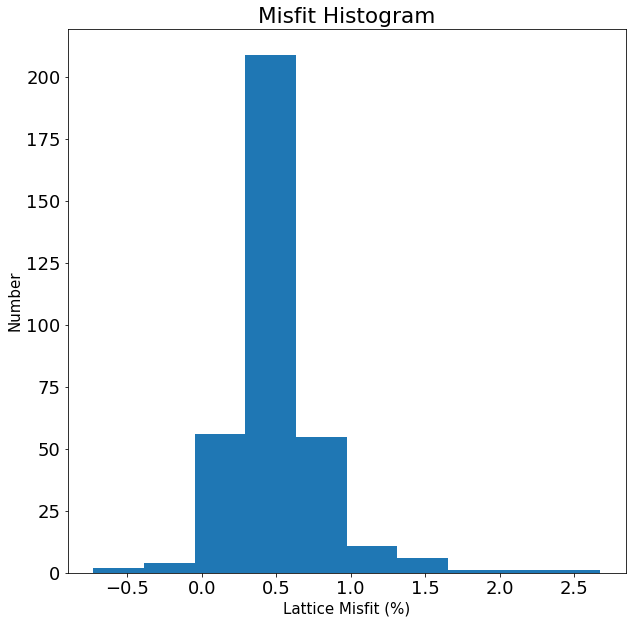

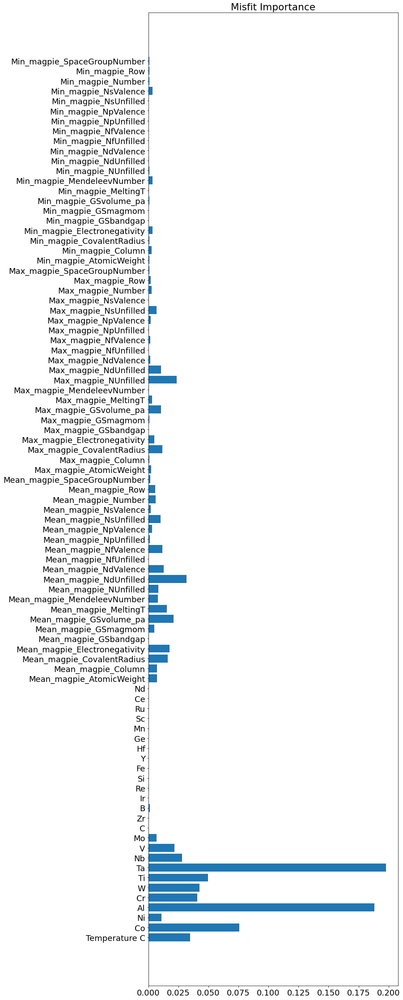

In [6]:
#generates misfit data, it is important for test_fit and plot_fit to be False, so that 100% training data is used
ML_misfit = predict_ML_misfit(input_df = input_df0,
                              misfit_file='ML-Co-input_lattice misfit.csv',
                              plot_histogram=True,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

In [7]:
def make_misfit_summary_table(num_states):
    summary_table = pd.DataFrame()
    
    #this makes a column with no test data split
    summary_table['ML_misfit_input'] = ML_misfit = predict_ML_misfit(input_df = input_df0,
                              misfit_file='ML-Co-input_lattice misfit.csv',
                              plot_histogram = False,                                       
                              test_fit=False,
                              plot_fit=False,                                       
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #this makes num_states columns with 90-10 data splits
    
    for i in range(num_states):
        ML_misfit = predict_ML_misfit(input_df = input_df0,
                              misfit_file='ML-Co-input_lattice misfit.csv',
                              plot_histogram = False,        
                              test_fit=True,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=i,
                              random_state2=0)

        summary_table[i+1] = ML_misfit
        summary_table = summary_table.copy()
        
        
    #now I can check the average, variance, etc. of how test data splits affect the final result
    
    return summary_table

In [8]:
#creating misfit summary table assuming 100 different training/test splits and seeing the differences in output

#allow turning this off to save time

generate_misfit_summary_table = False

if generate_misfit_summary_table == True:
    misfit_summary = make_misfit_summary_table(100)
    
    #giving some statistics, axis = 1 means rows, axis = 0 would be columns
    misfit_summary['mean'] = misfit_summary.mean(axis=1)
    misfit_summary['max']= misfit_summary.max(axis=1)
    misfit_summary['min']= misfit_summary.min(axis=1)
    misfit_summary['st dev']= misfit_summary.std(axis=1)

    misfit_summary
    misfit_summary.to_excel('misfit_MLoutput.xlsx', header=True, index=True)
    
    plt.rcParams["figure.figsize"] = (10,10)
    misfit_summary.plot(y='st dev', use_index=True)
    plt.xlabel('Alloy Index')
    plt.ylabel('Standard Deviation')
    plt.title('Standard Deviation')


    fig,ax=plt.subplots()
    ax.plot(range(0,misfit_summary.shape[0]),misfit_summary['ML_misfit_input']-misfit_summary['mean'])
    #ax.plot(range(0,334),misfit_summary['mean'], color ='r')
    ax.set_xlabel("Alloy Index")
    ax.set_ylabel("Difference Between Final Value and Average")
    ax.set_title("Average Accuracy")

In [9]:
#adds a new column to "data" dataframe with ML-predicted misfit
#also adds "used misfit" column which takes the experimental value if available, or ML value if not available
data['ML misfit']= ML_misfit
#print(data)
tempmisfit_data = pd.read_csv('ML-Co-input_lattice misfit.csv',encoding='ANSI')
tempmisfit_data = tempmisfit_data.drop_duplicates(subset=['Shortname'])


comparision_data=[]
comparison_data = pd.merge(data, 
                           tempmisfit_data[['Shortname', 'Temperature C', 'misfit']], 
                           on=['Shortname', 'Temperature C'], 
                           how="left")

data['used misfit']= comparison_data['misfit']
data['used misfit']=data['used misfit'].fillna(data['ML misfit'])




In [10]:
#TODO try with standard scalar?
#Standard scalar doesn't typically improve random forest regression

In [11]:
def predict_ML_solvus(input_df, raw_file, plot_histogram, test_fit, plot_fit, plot_importance, random_state1, random_state2):

    #input_df is the creep data, which the model will "test"
    #raw_file is the string for data including solvus, which the model will train
    #test_fit is bool, if True it will split misfit into test/training
    #plot_fit is bool, if True it graphs the fit
    #plot_importance is bool, if True it will plot importance
    #random_state allows control of random variables, in most cases it will be random_state=0

    #when defined as a function, these will be given in the call
    #input_df = input_df
    #raw_file = 'ML-Co-input_solvus_only.csv'
    #test_fit = True
    #plot_importance = True
    #random_state1 = 0
    #random_state2 = 0


    #takes the location of the misfit file and makes a dataframe "misfit_data"
    raw_data = pd.read_csv(raw_file,encoding='ANSI')


    #converts unrecognized values into 0
    raw_data = raw_data.fillna(0)

    #drop columns from data
    raw_data = raw_data.drop(columns=['solidus', 'liquidus','Index', 'Name','Paper'])

    magpie_names = get_chem_only_descriptors(formula=raw_data.Shortname[0], source="magpie")[1]
    raw_data[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in raw_data['Shortname']]

    #split data into test and training if desired
    #"random_state" is defined in the function so that this number can be cycled if desired 
    
    if plot_histogram == True:
        plt.figure(figsize=(10,10))
        plt.hist(raw_data['solvus'])
        plt.xlabel('Solvus (C)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Solvus Histogram")
        plt.show()
        
    if test_fit == True:
        data_train, data_test = train_test_split(raw_data, test_size=0.1, random_state=random_state1)

        Y_train = data_train['solvus'].tolist()
        X_train = data_train.drop(columns = ["Shortname", "solvus"])
        Y_test = data_test['solvus'].tolist()
        X_test = data_test.drop(columns = ["Shortname","solvus"])


    else:
        data_train = raw_data

        Y_train = data_train['solvus'].tolist()
        X_train = data_train.drop(columns = ["Shortname","solvus"])
        X_test = []
        Y_test = []

    
    regr = RandomForestRegressor(n_estimators=3000, max_depth=15, random_state = random_state2).fit(X_train, Y_train)
    
    if test_fit == True:
        Y_pred = regr.predict(X_test)

    if plot_importance == True:
        # summarize feature importance
        importance = regr.feature_importances_
        #for i,v in enumerate(importance0):
            #print('Feature: %0d, Score: %.5f' % (i,v))          

        plt.rcParams["figure.figsize"] = (10,40)
        plt.barh(X_train.columns, importance)
        plt.title("Solvus Importance")
        plt.show()

    if test_fit == True and plot_fit ==True:
        MSE_misfit = mean_squared_error(Y_test, Y_pred, squared=True)
        print(f"MSE: {'{:.2e}'.format(MSE_misfit)}")

        Y_test_percent = [i for i in Y_test]
        Y_pred_percent = [i for i in Y_pred]

        plt.figure(figsize=(10,10))
        plt.scatter(Y_test_percent, Y_pred_percent, c='crimson')
        plt.errorbar(Y_test_percent, Y_pred_percent, xerr=20, c='crimson', fmt="o")
        

        p1 = max(max(Y_pred_percent), max(Y_test_percent))
        p2 = min(min(Y_pred_percent), min(Y_test_percent))
        plt.plot([p1, p2], [p1, p2], 'b-')
        plt.xlabel('Solvus (C)', fontsize=15)
        plt.ylabel('Predictions (C)', fontsize=15)
        plt.title(f"MSE: {'{:.2e}'.format(MSE_misfit)}")
        plt.axis('equal')
        plt.show()

        #Make more detailed plot
        raw_results = X_test
        raw_results['shortname']= raw_data['Shortname']
        raw_results['Y_pred'] = Y_pred
        raw_results['Y_test'] = Y_test

        fig2 = px.scatter(raw_results, x= "Y_test", y="Y_pred", hover_name = "shortname")

        fig2.update_traces(marker=dict(size=15,
                                      line=dict(width=2,)),
                          selector=dict(mode='markers'))




        fig2.add_trace(
            go.Scatter(
                y=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                x=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                mode="lines",
                line=go.scatter.Line(color="red"),
                showlegend=False)
        )

        fig2.show()
    
    
    input_df = input_df[['Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 
                         'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd',
                         'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 
                         'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 
                         'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 
                         'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 
                         'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 
                         'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 
                         'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 
                         'Max_magpie_AtomicWeight', 'Max_magpie_Column', 'Max_magpie_CovalentRadius', 
                         'Max_magpie_Electronegativity', 'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 
                         'Max_magpie_GSvolume_pa', 'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 
                         'Max_magpie_NUnfilled', 'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 
                         'Max_magpie_NfUnfilled', 'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 
                         'Max_magpie_NpValence', 'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 
                         'Max_magpie_Number', 'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 
                         'Min_magpie_AtomicWeight', 'Min_magpie_Column', 'Min_magpie_CovalentRadius', 
                         'Min_magpie_Electronegativity', 'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 
                         'Min_magpie_GSvolume_pa', 'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 
                         'Min_magpie_NUnfilled', 'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 
                         'Min_magpie_NfUnfilled', 'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 
                         'Min_magpie_NpValence', 'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 
                         'Min_magpie_Number', 'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber']]

#     input_df = input_df.drop(columns = ["Shortname","Stress (MPa)","Strain Rate (min) /s", "Time to 1% strain (s)",
#                                        "log(time)", "Sol. Temp (ºC)","Sol. Time (h)", "1 age temp (ºC)", "1 age time (h)",
#                                        "2 age temp (ºC)", "2 age time (hr)", "C/T", "Orientation", "VolFrac (%)", 
#                                         "Deff = sum DI","Temperature C" ])
    
    raw_pred = regr.predict(input_df)

    return raw_pred


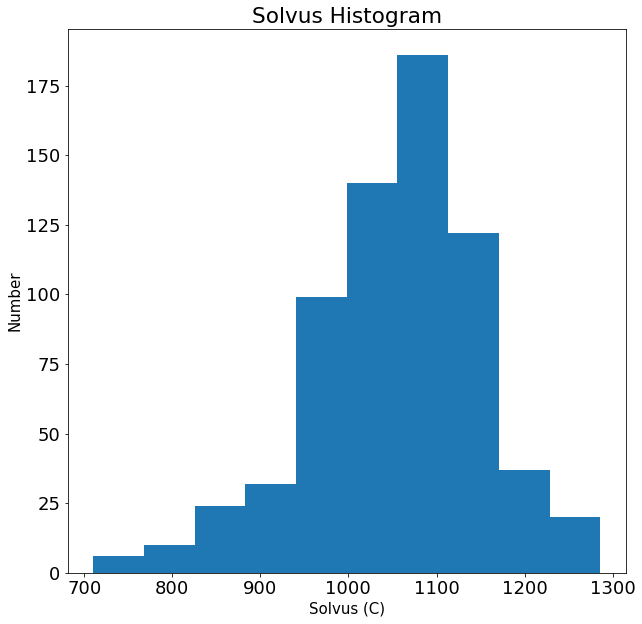

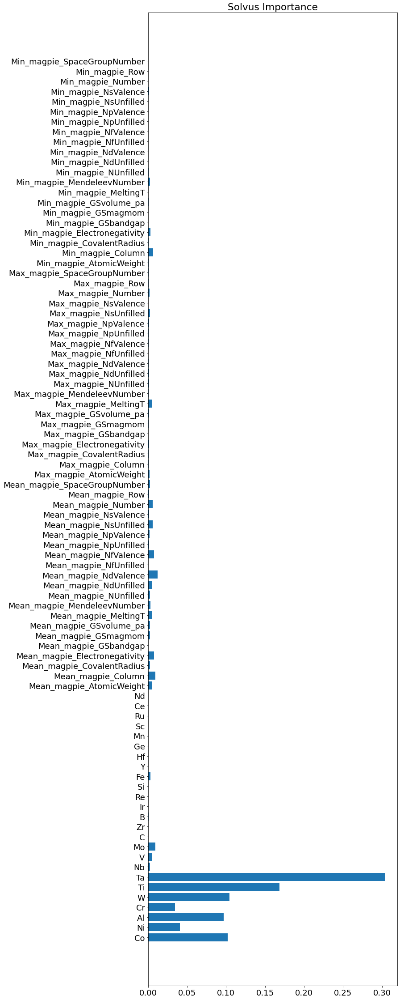

In [12]:
#generates solvus data, it is important for test_fit and plot_fit to be False, so that 100% training data is used
ML_solvus = predict_ML_solvus(input_df = input_df0,
                              raw_file='ML-Co-input_solvus_only.csv',
                              plot_histogram=True,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

In [13]:
def make_solvus_summary_table(num_states):
    summary_table = pd.DataFrame()
    
    #this makes a column with no test data split
    summary_table['ML_solvus_input'] = ML_solvus = predict_ML_solvus(input_df = input_df0,
                              raw_file='ML-Co-input_solvus_only.csv',
                              test_fit=False,
                              plot_histogram=False,                                       
                              plot_fit=False,                                       
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #this makes num_states columns with 90-10 data splits
    for i in range(num_states):
        ML_solvus = predict_ML_solvus(input_df = input_df0,
                              raw_file='ML-Co-input_solvus_only.csv',
                              test_fit=True,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=i,
                              random_state2=0)

        summary_table[i+1] = ML_solvus
        summary_table = summary_table.copy()
        
    #now I can check the average, variance, etc. of how test data splits affect the final result
    
    return summary_table

In [14]:
#creating solvus summary table assuming 100 different training/test splits and seeing the differences in output

#allow turning this off to save time

generate_solvus_summary_table = False

if generate_solvus_summary_table == True:
    solvus_summary = make_solvus_summary_table(100)
    
    #giving some statistics, axis = 1 means rows, axis = 0 would be columns
    solvus_summary['mean'] = solvus_summary.mean(axis=1)
    solvus_summary['max']= solvus_summary.max(axis=1)
    solvus_summary['min']= solvus_summary.min(axis=1)
    solvus_summary['st dev']= solvus_summary.std(axis=1)

    solvus_summary
    solvus_summary.to_excel('solvus_MLoutput.xlsx', header=True, index=True)
    
    plt.rcParams["figure.figsize"] = (10,10)
    solvus_summary.plot(y='st dev', use_index=True)
    plt.xlabel('Alloy Index')
    plt.ylabel('Standard Deviation')
    plt.title('Standard Deviation')

    fig,ax=plt.subplots()
    ax.plot(range(0,solvus_summary.shape[0]),solvus_summary['ML_solvus_input']-solvus_summary['mean'])
    #ax.plot(range(0,334),misfit_summary['mean'], color ='r')
    ax.set_xlabel("Alloy Index")
    ax.set_ylabel("Difference Between Final Value and Average")
    ax.set_title("Average Accuracy")

In [15]:
#adds a new column to "data" dataframe with ML-predicted solvus
data['ML solvus']= ML_solvus
tempsolvus_data = pd.read_csv('ML-Co-input_solvus_only.csv',encoding='ANSI')
tempsolvus_data = tempsolvus_data.drop_duplicates(subset=['Shortname'])

comparison_data=[]
comparison_data = pd.merge(data, tempsolvus_data[['Shortname', 'solvus']], on=['Shortname'], how="left")

#note, in case there are 2 values in the database for the same Shortname, it appears to alternate


data['used solvus']= comparison_data['solvus']
data['used solvus']=data['used solvus'].fillna(data['ML solvus'])




In [16]:
# x = data['used solvus'].fillna(0)
# y = data['ML solvus']

# plt.figure(figsize=(10,10))
# plt.scatter(x, y)
# plt.xlim([950,1250])
# plt.show()

In [17]:
def predict_ML_solidus(input_df, raw_file, plot_histogram, test_fit, plot_fit, plot_importance, random_state1, random_state2):

    
    #input_df is the creep data, which the model will "test"
    #raw_file is the string for data including solidus, which the model will train
    #test_fit is bool, if True it will split misfit into test/training
    #plot_fit is bool, if True it graphs the fit
    #plot_importance is bool, if True it will plot importance
    #random_state allows control of random variables, in most cases it will be random_state=0

    #when defined as a function, these will be given in the call
    #input_df = input_df
    #raw_file = 'ML-Co-input_solidus_only'
    #test_fit = True
    #plot_importance = True
    #random_state1 = 0
    #random_state2 = 0

    #takes the location of the misfit file and makes a dataframe "misfit_data"
    raw_data = pd.read_csv(raw_file,encoding='ANSI')


    #converts unrecognized values into 0
    raw_data = raw_data.fillna(0)

    #drop columns from data
    #this renames solvus to "used solvus" to match the title of the "data" dataframe. 
    #There are some rows with no solvus values, however. Another method would be to run the solvus function
    raw_data.rename(columns = {'solvus':'used solvus'}, inplace = True)
    raw_data = raw_data.drop(columns=['liquidus','Index', 'Name','Paper'])
    

    magpie_names = get_chem_only_descriptors(formula=raw_data.Shortname[0], source="magpie")[1]
    raw_data[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in raw_data['Shortname']]
    
    #predicting solvus on solidus data
    ML_raw_solvus = predict_ML_solvus(input_df = raw_data,
                              raw_file='ML-Co-input_solvus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #add ML solvus prediction of solidus data to solidus data
    raw_data['ML solvus']=ML_raw_solvus
    
    #replace ML solvus with real solvus if available
    tempsolvus_data = pd.read_csv('ML-Co-input_solvus_only.csv',encoding='ANSI')
    tempsolvus_data = tempsolvus_data.drop_duplicates(subset=['Shortname'])

    comparison_data=[]
    comparison_data = pd.merge(raw_data, tempsolvus_data[['Shortname', 'solvus']], on=['Shortname'], how="left")
    
    raw_data['used solvus']=comparison_data['solvus']
    raw_data['used solvus']=raw_data['used solvus'].fillna(raw_data['ML solvus'])
    raw_data=raw_data.drop(columns=['ML solvus'])
    

    #split data into test and training if desired
    #"random_state" is defined in the function so that this number can be cycled if desired 
    
    if plot_histogram == True:
        plt.figure(figsize=(10,10))
        plt.hist(raw_data['solidus'])
        plt.xlabel('Solidus (C)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Solidus Histogram")
        plt.show()
        
    if test_fit == True:
        data_train, data_test = train_test_split(raw_data, test_size=0.1, random_state=random_state1)

        Y_train = data_train['solidus'].tolist()
        X_train = data_train.drop(columns = ["Shortname", "solidus"])
        Y_test = data_test['solidus'].tolist()
        X_test = data_test.drop(columns = ["Shortname","solidus"])
    
    else:
        data_train = raw_data

        Y_train = data_train['solidus'].tolist()
        X_train = data_train.drop(columns = ["Shortname","solidus"])
        X_test = []
        Y_test = []

    regr = RandomForestRegressor(n_estimators=3000, max_depth=15, random_state = random_state2).fit(X_train, Y_train)
    
    if test_fit == True:
        Y_pred = regr.predict(X_test)

    if plot_importance == True:
        # summarize feature importance
        importance = regr.feature_importances_
        #for i,v in enumerate(importance0):
            #print('Feature: %0d, Score: %.5f' % (i,v))          

        plt.rcParams["figure.figsize"] = (10,40)
        plt.barh(X_train.columns, importance)
        plt.title("Solidus Importance")
        plt.show()

    if test_fit == True and plot_fit ==True:
        MSE_misfit = mean_squared_error(Y_test, Y_pred, squared=True)
        print(f"MSE: {'{:.2e}'.format(MSE_misfit)}")

        Y_test_percent = result = [i for i in Y_test]
        Y_pred_percent = result = [i for i in Y_pred]

        plt.figure(figsize=(10,10))
        plt.scatter(Y_test_percent, Y_pred_percent, c='crimson')
        plt.errorbar(Y_test_percent, Y_pred_percent, xerr=20, c='crimson', fmt="o")

        p1 = max(max(Y_pred_percent), max(Y_test_percent))
        p2 = min(min(Y_pred_percent), min(Y_test_percent))
        plt.plot([p1, p2], [p1, p2], 'b-')
        plt.xlabel('Solidus (C)', fontsize=15)
        plt.ylabel('Predictions (C)', fontsize=15)
        plt.title(f"MSE: {'{:.2e}'.format(MSE_misfit)}")
        plt.axis('equal')
        plt.show()

        #Make more detailed plot
        raw_results = X_test
        raw_results['shortname']= raw_data['Shortname']
        raw_results['Y_pred'] = Y_pred
        raw_results['Y_test'] = Y_test

        fig2 = px.scatter(raw_results, x= "Y_test", y="Y_pred", hover_name = "shortname")

        fig2.update_traces(marker=dict(size=15,
                                      line=dict(width=2,)),
                          selector=dict(mode='markers'))




        fig2.add_trace(
            go.Scatter(
                y=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                x=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                mode="lines",
                line=go.scatter.Line(color="red"),
                showlegend=False)
        )

        fig2.show()

    
    input_df = input_df[['used solvus',
                         'Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 
                         'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd',
                         'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 
                         'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 
                         'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 
                         'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 
                         'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 
                         'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 
                         'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 
                         'Max_magpie_AtomicWeight', 'Max_magpie_Column', 'Max_magpie_CovalentRadius', 
                         'Max_magpie_Electronegativity', 'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 
                         'Max_magpie_GSvolume_pa', 'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 
                         'Max_magpie_NUnfilled', 'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 
                         'Max_magpie_NfUnfilled', 'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 
                         'Max_magpie_NpValence', 'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 
                         'Max_magpie_Number', 'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 
                         'Min_magpie_AtomicWeight', 'Min_magpie_Column', 'Min_magpie_CovalentRadius', 
                         'Min_magpie_Electronegativity', 'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 
                         'Min_magpie_GSvolume_pa', 'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 
                         'Min_magpie_NUnfilled', 'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 
                         'Min_magpie_NfUnfilled', 'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 
                         'Min_magpie_NpValence', 'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 
                         'Min_magpie_Number', 'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber']]
    
#     input_df = input_df.drop(columns = ["Shortname","Stress (MPa)","Strain Rate (min) /s", "Time to 1% strain (s)",
#                                        "log(time)", "Sol. Temp (ºC)","Sol. Time (h)", "1 age temp (ºC)", "1 age time (h)",
#                                        "2 age temp (ºC)", "2 age time (hr)", "C/T", "Orientation", "VolFrac (%)", 
#                                         "Deff = sum DI","Temperature C", "ML misfit", "used misfit", "ML solvus" ])
    #print(list(input_df.columns))
    
    raw_pred = regr.predict(input_df)
    

    return raw_pred


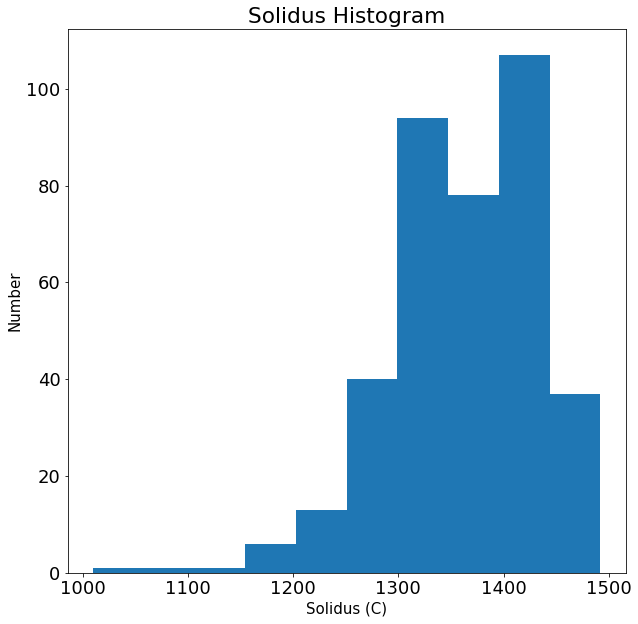

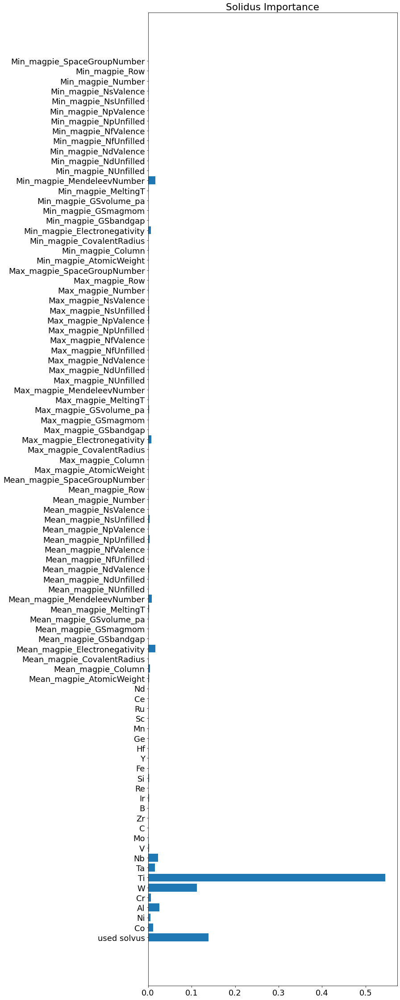

In [18]:
#generates solidus prediction, it is important for test_fit and plot_fit to be False, so that 100% training data is used
ML_solidus = predict_ML_solidus(input_df = data,
                              raw_file='ML-Co-input_solidus_only.csv',
                              plot_histogram = True,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

In [19]:
def make_solidus_summary_table(num_states):
    summary_table = pd.DataFrame()
    
    #this makes a column with no test data split
    summary_table['ML_solidus_input'] = ML_solidus = predict_ML_solidus(input_df = data,
                              raw_file='ML-Co-input_solidus_only.csv',
                              test_fit=False,
                              plot_histogram=False,
                              plot_fit=False,                                       
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #this makes num_states columns with 90-10 data splits and repeats for num_states
    for i in range(num_states):
        ML_solidus = predict_ML_solidus(input_df = data,
                              raw_file='ML-Co-input_solidus_only.csv',
                              test_fit=True,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=i,
                              random_state2=0)

        summary_table[i+1] = ML_solidus
        summary_table = summary_table.copy()
        
    #now I can check the average, variance, etc. of how test data splits affect the final result
    
    return summary_table

In [20]:
#creating solidus summary table assuming 100 different training/test splits and seeing the differences in output

#allow turning this off to save time

generate_solidus_summary_table = False

if generate_solidus_summary_table == True:
    solidus_summary = make_solidus_summary_table(100)
    
    #giving some statistics, axis = 1 means rows, axis = 0 would be columns
    solidus_summary['mean'] = solidus_summary.mean(axis=1)
    solidus_summary['max']= solidus_summary.max(axis=1)
    solidus_summary['min']= solidus_summary.min(axis=1)
    solidus_summary['st dev']= solidus_summary.std(axis=1)

    solidus_summary
    solidus_summary.to_excel('solidus_MLoutput.xlsx', header=True, index=True)
    
    plt.rcParams["figure.figsize"] = (10,10)
    solidus_summary.plot(y='st dev', use_index=True)
    plt.xlabel('Alloy Index')
    plt.ylabel('Standard Deviation')
    plt.title('Standard Deviation')

    fig,ax=plt.subplots()
    ax.plot(range(0,solidus_summary.shape[0]),solidus_summary['ML_solidus_input']-solidus_summary['mean'])
    #ax.plot(range(0,334),misfit_summary['mean'], color ='r')
    
    ax.set_xlabel("Alloy Index")
    ax.set_ylabel("Difference Between Final Value and Average")
    ax.set_title("Average Accuracy")

In [21]:
#adds a new column to "data" dataframe with ML-predicted solidus
data['ML solidus']= ML_solidus

tempsolidus_data = pd.read_csv('ML-Co-input_solidus_only.csv',encoding='ANSI')
tempsolidus_data = tempsolidus_data.drop_duplicates(subset=['Shortname'])

comparison_data=[]
comparison_data = pd.merge(data, tempsolidus_data[['Shortname', 'solidus']], on=['Shortname'], how="left")

data['used solidus']= comparison_data['solidus']
data['used solidus']=data['used solidus'].fillna(data['ML solidus'])

In [22]:
# x = data['used solvus'].fillna(0)
# y = data['ML solvus']

# plt.figure(figsize=(10,10))
# plt.scatter(x, y)
# plt.xlim([900,1300])
# plt.show()

In [23]:
def predict_ML_liquidus(input_df, raw_file, plot_histogram, test_fit, plot_fit, plot_importance, random_state1, random_state2):

    #input_df is the creep data, which the model will "test"
    #raw_file is the string for data including solidus, which the model will train
    #test_fit is bool, if True it will split misfit into test/training
    #plot_fit is bool, if True it graphs the fit
    #plot_importance is bool, if True it will plot importance
    #random_state allows control of random variables, in most cases it will be random_state=0

    #when defined as a function, these will be given in the call
    #input_df = input_df
    #raw_file = 'ML-Co-input_liquidus_only'
    #test_fit = True
    #plot_importance = True
    #random_state1 = 0
    #random_state2 = 0


    #takes the location of the misfit file and makes a dataframe "misfit_data"
    raw_data = pd.read_csv(raw_file,encoding='ANSI')


    #converts unrecognized values into 0
    raw_data = raw_data.fillna(0)
    
    #drop columns from data
    #this renames solvus and solidus to "used solvus" and "used solidus" to match the title of the "data" dataframe. 
    raw_data.rename(columns = {'solvus':'used solvus'}, inplace = True)
    raw_data.rename(columns = {'solidus':'used solidus'}, inplace = True)
    raw_data = raw_data.drop(columns=['Index', 'Name','Paper'])

    magpie_names = get_chem_only_descriptors(formula=raw_data.Shortname[0], source="magpie")[1]
    raw_data[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in raw_data['Shortname']]
    
    #predicting solvus on liquidus data
    ML_raw_solvus = predict_ML_solvus(input_df = raw_data,
                              raw_file='ML-Co-input_solvus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #predicting solidus on liquidus data
    ML_raw_solidus = predict_ML_solidus(input_df = raw_data,
                              raw_file='ML-Co-input_solidus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #add ML solvus prediction of data to liquidus data
    raw_data['ML solvus']=ML_raw_solvus
    raw_data['ML solidus']=ML_raw_solidus
    
    #replace ML solvus and solidus with real solvus if available
    tempsolvus_data = pd.read_csv('ML-Co-input_solvus_only.csv',encoding='ANSI')
    tempsolvus_data = tempsolvus_data.drop_duplicates(subset=['Shortname'])
    tempsolidus_data = pd.read_csv('ML-Co-input_solidus_only.csv',encoding='ANSI')
    tempsolidus_data = tempsolidus_data.drop_duplicates(subset=['Shortname'])

    comparison_data=[]
    
    comparison_data = pd.merge(raw_data, tempsolvus_data[['Shortname', 'solvus']], on=['Shortname'], how="left")
    raw_data['used solvus']=comparison_data['solvus']
    raw_data['used solvus']=raw_data['used solvus'].fillna(raw_data['ML solvus'])
    raw_data=raw_data.drop(columns=['ML solvus'])
    
    comparison_data = pd.merge(raw_data, tempsolidus_data[['Shortname', 'solidus']], on=['Shortname'], how="left")
    raw_data['used solidus']=comparison_data['solidus']
    raw_data['used solidus']=raw_data['used solidus'].fillna(raw_data['ML solidus'])
    raw_data=raw_data.drop(columns=['ML solidus'])

    
    #split data into test and training if desired
    #"random_state" is defined in the function so that this number can be cycled if desired 
    
    if plot_histogram == True:
        plt.figure(figsize=(10,10))
        plt.hist(raw_data['liquidus'])
        plt.xlabel('Liquidus (C)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Liquidus Histogram")
        plt.show()
        
    if test_fit == True:
        data_train, data_test = train_test_split(raw_data, test_size=0.1, random_state=random_state1)

        Y_train = data_train['liquidus'].tolist()
        X_train = data_train.drop(columns = ["Shortname", "liquidus"])
        Y_test = data_test['liquidus'].tolist()
        X_test = data_test.drop(columns = ["Shortname","liquidus"])


    else:
        data_train = raw_data

        Y_train = data_train['liquidus'].tolist()
        X_train = data_train.drop(columns = ["Shortname","liquidus"])
        X_test = []
        Y_test = []

    regr = RandomForestRegressor(n_estimators=3000, max_depth=15, random_state = random_state2).fit(X_train, Y_train)
    
    if test_fit == True:
        Y_pred = regr.predict(X_test)

    if plot_importance == True:
        # summarize feature importance
        importance = regr.feature_importances_
        #for i,v in enumerate(importance0):
            #print('Feature: %0d, Score: %.5f' % (i,v))          

        plt.rcParams["figure.figsize"] = (10,40)
        plt.barh(X_train.columns, importance)
        plt.title("Liquidus Importance")
        plt.show()

    if test_fit == True and plot_fit ==True:
        MSE_misfit = mean_squared_error(Y_test, Y_pred, squared=True)
        print(f"MSE: {'{:.2e}'.format(MSE_misfit)}")

        Y_test_percent = result = [i for i in Y_test]
        Y_pred_percent = result = [i for i in Y_pred]

        plt.figure(figsize=(10,10))
        plt.scatter(Y_test_percent, Y_pred_percent, c='crimson')
        plt.errorbar(Y_test_percent, Y_pred_percent, xerr=20, c='crimson', fmt="o")

        p1 = max(max(Y_pred_percent), max(Y_test_percent))
        p2 = min(min(Y_pred_percent), min(Y_test_percent))
        plt.plot([p1, p2], [p1, p2], 'b-')
        plt.xlabel('Liquidus (C)', fontsize=15)
        plt.ylabel('Predictions (C)', fontsize=15)
        plt.title(f"MSE: {'{:.2e}'.format(MSE_misfit)}")
        plt.axis('equal')
        plt.show()

        #Make more detailed plot
        raw_results = X_test
        raw_results['shortname']= raw_data['Shortname']
        raw_results['Y_pred'] = Y_pred
        raw_results['Y_test'] = Y_test

        fig2 = px.scatter(raw_results, x= "Y_test", y="Y_pred", hover_name = "shortname")

        fig2.update_traces(marker=dict(size=15,
                                      line=dict(width=2,)),
                          selector=dict(mode='markers'))




        fig2.add_trace(
            go.Scatter(
                y=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                x=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                mode="lines",
                line=go.scatter.Line(color="red"),
                showlegend=False)
        )

        fig2.show()

        
    input_df = input_df[['used solvus', 'used solidus',
                             'Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 
                         'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd',
                         'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 
                         'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 
                         'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 
                         'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 
                         'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 
                         'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 
                         'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 
                         'Max_magpie_AtomicWeight', 'Max_magpie_Column', 'Max_magpie_CovalentRadius', 
                         'Max_magpie_Electronegativity', 'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 
                         'Max_magpie_GSvolume_pa', 'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 
                         'Max_magpie_NUnfilled', 'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 
                         'Max_magpie_NfUnfilled', 'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 
                         'Max_magpie_NpValence', 'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 
                         'Max_magpie_Number', 'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 
                         'Min_magpie_AtomicWeight', 'Min_magpie_Column', 'Min_magpie_CovalentRadius', 
                         'Min_magpie_Electronegativity', 'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 
                         'Min_magpie_GSvolume_pa', 'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 
                         'Min_magpie_NUnfilled', 'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 
                         'Min_magpie_NfUnfilled', 'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 
                         'Min_magpie_NpValence', 'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 
                         'Min_magpie_Number', 'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber']]
        
#     input_df = input_df.drop(columns = ["Shortname","Stress (MPa)","Strain Rate (min) /s", "Time to 1% strain (s)",
#                                        "log(time)", "Sol. Temp (ºC)","Sol. Time (h)", "1 age temp (ºC)", "1 age time (h)",
#                                        "2 age temp (ºC)", "2 age time (hr)", "C/T", "Orientation", "VolFrac (%)", 
#                                         "Deff = sum DI","Temperature C","ML misfit", "used misfit", "ML solvus",
#                                        "ML solidus"])

    #print(list(input_df.columns))


    raw_pred = regr.predict(input_df)

    return raw_pred


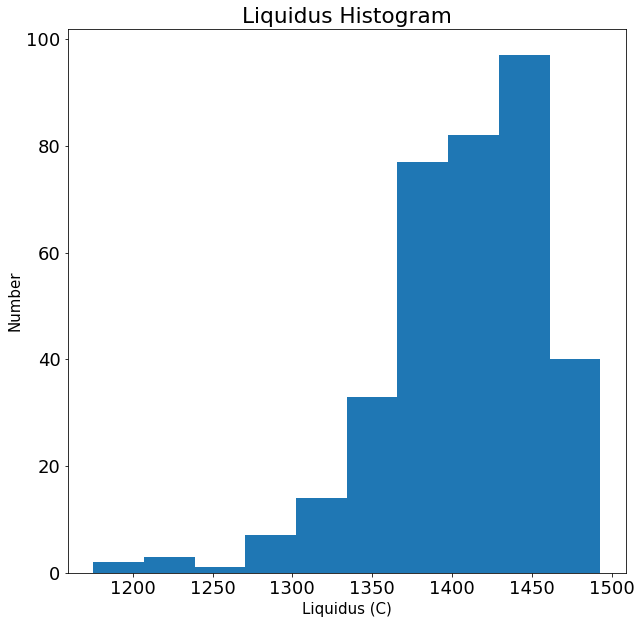

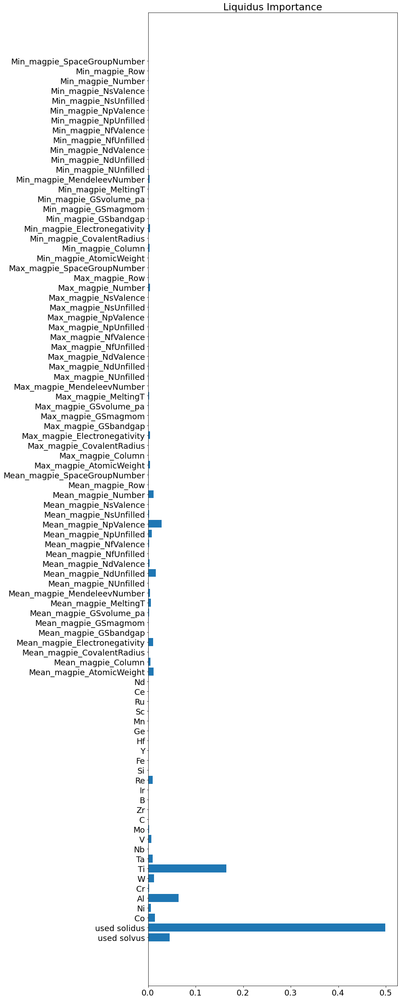

In [24]:
#generates liquidus prediction, it is important for test_fit and plot_fit to be False, so that 100% training data is used
ML_liquidus = predict_ML_liquidus(input_df = data,
                              raw_file='ML-Co-input_liquidus_only.csv',
                              plot_histogram=True,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

In [25]:
def make_liquidus_summary_table(num_states):
    summary_table = pd.DataFrame()
    
    #this makes a column with no test data split
    summary_table['ML_liquidus_input'] = ML_liquidus = predict_ML_liquidus(input_df = data,
                              raw_file='ML-Co-input_liquidus_only.csv',
                              test_fit=False,
                              plot_histogram=False,
                              plot_fit=False,                                       
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #this makes num_states columns with 90-10 data splits
    for i in range(num_states):
        ML_liquidus = predict_ML_liquidus(input_df = data,
                              raw_file='ML-Co-input_liquidus_only.csv',
                              test_fit=True,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=i,
                              random_state2=0)

        summary_table[i+1] = ML_liquidus
        summary_table = summary_table.copy()
        
    #now I can check the average, variance, etc. of how test data splits affect the final result
    
    return summary_table

In [26]:
#creating liquidus summary table assuming 100 different training/test splits and seeing the differences in output

#allow turning this off to save time

generate_liquidus_summary_table = False

if generate_liquidus_summary_table == True:
    liquidus_summary = make_liquidus_summary_table(100)
    
    #giving some statistics, axis = 1 means rows, axis = 0 would be columns
    liquidus_summary['mean'] = liquidus_summary.mean(axis=1)
    liquidus_summary['max']= liquidus_summary.max(axis=1)
    liquidus_summary['min']= liquidus_summary.min(axis=1)
    liquidus_summary['st dev']= liquidus_summary.std(axis=1)

    liquidus_summary
    liquidus_summary.to_excel('liquidus_MLoutput.xlsx', header=True, index=True)
    
    plt.rcParams["figure.figsize"] = (10,10)
    liquidus_summary.plot(y='st dev', use_index=True)
    plt.xlabel('Alloy Index')
    plt.ylabel('Standard Deviation')
    plt.title('Standard Deviation')

    fig,ax=plt.subplots()
    ax.plot(range(0,liquidus_summary.shape[0]),liquidus_summary['ML_liquidus_input']-liquidus_summary['mean'])
    #ax.plot(range(0,334),misfit_summary['mean'], color ='r')
    ax.set_xlabel("Alloy Index")
    ax.set_ylabel("Difference Between Final Value and Average")
    ax.set_title("Average Accuracy")

In [27]:
#adds a new column to "data" dataframe with ML-predicted liquidus
data['ML liquidus']= ML_liquidus

templiquidus_data = pd.read_csv('ML-Co-input_liquidus_only.csv',encoding='ANSI')
templiquidus_data = templiquidus_data.drop_duplicates(subset=['Shortname'])

comparison_data=[]
comparison_data = pd.merge(data, templiquidus_data[['Shortname', 'liquidus']], on=['Shortname'], how="left")

data['used liquidus']= comparison_data['liquidus']
data['used liquidus']=data['used liquidus'].fillna(data['ML liquidus'])

In [28]:
# x = data['used liquidus'].fillna(0)
# y = data['ML liquidus']

# plt.figure(figsize=(10,10))
# plt.scatter(x, y)
# plt.xlim([1200,1500])
# plt.ylim([1200,1500])
# plt.show()

In [29]:
def predict_ML_Vf(input_df, raw_file, plot_histogram, test_fit, plot_fit, plot_importance, random_state1, random_state2):

    #input_df is the creep data, which the model will "test"
    #raw_file is the string for data including solidus, which the model will train
    #test_fit is bool, if True it will split misfit into test/training
    #plot_fit is bool, if True it graphs the fit
    #plot_importance is bool, if True it will plot importance
    #random_state allows control of random variables, in most cases it will be random_state=0

    #when defined as a function, these will be given in the call
    #input_df = input_df
    #raw_file = 'ML-Co-input_YS'
    #test_fit = True
    #plot_importance = True
    #random_state1 = 0
    #random_state2 = 0


    #takes the location of the misfit file and makes a dataframe "raw_data"
    raw_data = pd.read_csv(raw_file,encoding='ANSI')


    #converts unrecognized values into 0
    raw_data = raw_data.fillna(0)

    #drop columns from data
    raw_data = raw_data.drop(columns=['Index', 'Name','Paper','Notes','aging time'])

    magpie_names = get_chem_only_descriptors(formula=raw_data.Shortname[0], source="magpie")[1]
    raw_data[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in raw_data['Shortname']]
    #add solvus, solidus, liquidus    
    
    #predicting solvus on Vf data
    ML_raw_solvus = predict_ML_solvus(input_df = raw_data,
                              raw_file='ML-Co-input_solvus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    raw_data['ML solvus']=ML_raw_solvus
    tempsolvus_data = pd.read_csv('ML-Co-input_solvus_only.csv',encoding='ANSI')
    tempsolvus_data = tempsolvus_data.drop_duplicates(subset=['Shortname'])

    comparison_data=[]
    comparison_data = pd.merge(raw_data, tempsolvus_data[['Shortname', 'solvus']], on=['Shortname'], how="left")
    raw_data['used solvus']=comparison_data['solvus']
    raw_data['used solvus']=raw_data['used solvus'].fillna(raw_data['ML solvus'])
    raw_data=raw_data.drop(columns=['ML solvus'])
    
    #predicting solidus on YS data
    ML_raw_solidus = predict_ML_solidus(input_df = raw_data,
                              raw_file='ML-Co-input_solidus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    raw_data['ML solidus']=ML_raw_solidus
    tempsolidus_data = pd.read_csv('ML-Co-input_solidus_only.csv',encoding='ANSI')
    tempsolidus_data = tempsolidus_data.drop_duplicates(subset=['Shortname'])
    comparison_data=[]
    comparison_data = pd.merge(raw_data, tempsolidus_data[['Shortname', 'solidus']], on=['Shortname'], how="left")
    raw_data['used solidus']=comparison_data['solidus']
    raw_data['used solidus']=raw_data['used solidus'].fillna(raw_data['ML solidus'])
    raw_data=raw_data.drop(columns=['ML solidus'])
    
    #predicting liquidus on YS data
    ML_raw_liquidus = predict_ML_liquidus(input_df = raw_data,
                              raw_file='ML-Co-input_liquidus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0) 
    
    raw_data['ML liquidus']=ML_raw_liquidus
    templiquidus_data = pd.read_csv('ML-Co-input_liquidus_only.csv',encoding='ANSI')
    templiquidus_data = templiquidus_data.drop_duplicates(subset=['Shortname'])
    comparison_data=[]
    comparison_data = pd.merge(raw_data, templiquidus_data[['Shortname', 'liquidus']], on=['Shortname'], how="left")
    raw_data['used liquidus']=comparison_data['liquidus']
    raw_data['used liquidus']=raw_data['used liquidus'].fillna(raw_data['ML liquidus'])
    raw_data=raw_data.drop(columns=['ML liquidus'])


    #split data into test and training if desired
    #"random_state" is defined in the function so that this number can be cycled if desired 

    
    if plot_histogram == True:
        plt.figure(figsize=(10,10))
        plt.hist(raw_data['Vf'])
        plt.xlabel('Vf (%)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("L12 Volume Fraction Histogram")
        plt.show()
        
        plt.figure(figsize=(10,10))
        plt.hist(raw_data['Temperature C'])
        plt.xlabel('Temperature (C)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Vf aging Temperature Histogram")
        plt.show()
        
    if test_fit == True:
        data_train, data_test = train_test_split(raw_data, test_size=0.1, random_state=random_state1)

        Y_train = data_train['Vf'].tolist()
        X_train = data_train.drop(columns = ["Shortname", "Vf"])
        Y_test = data_test['Vf'].tolist()
        X_test = data_test.drop(columns = ["Shortname","Vf"])


    else:
        data_train = raw_data

        Y_train = data_train['Vf'].tolist()
        X_train = data_train.drop(columns = ["Shortname","Vf"])
        X_test = []
        Y_test = []

    
    regr = RandomForestRegressor(n_estimators=3000, max_depth=15, random_state = random_state2).fit(X_train, Y_train)
    
    if test_fit == True:
        Y_pred = regr.predict(X_test)

    if plot_importance == True:
        # summarize feature importance
        importance = regr.feature_importances_
        #for i,v in enumerate(importance0):
            #print('Feature: %0d, Score: %.5f' % (i,v))          

        plt.rcParams["figure.figsize"] = (10,40)
        plt.barh(X_train.columns, importance)
        plt.title("L12 Volume Fraction Importance")
        plt.show()

    if test_fit == True and plot_fit ==True:
        MSE_misfit = mean_squared_error(Y_test, Y_pred, squared=True)
        print(f"MSE: {'{:.2e}'.format(MSE_misfit)}")

        Y_test_percent = result = [i for i in Y_test]
        Y_pred_percent = result = [i for i in Y_pred]

        plt.figure(figsize=(10,10))
        plt.scatter(Y_test_percent, Y_pred_percent, c='crimson')
        plt.errorbar(Y_test_percent, Y_pred_percent, xerr=10, c='crimson', fmt="o")

        p1 = max(max(Y_pred_percent), max(Y_test_percent))
        p2 = min(min(Y_pred_percent), min(Y_test_percent))
        plt.plot([p1, p2], [p1, p2], 'b-')
        plt.xlabel('Vf (%)', fontsize=15)
        plt.ylabel('Predictions (%)', fontsize=15)
        plt.title(f"MSE: {'{:.2e}'.format(MSE_misfit)}")
        plt.axis('equal')
        plt.show()

        #Make more detailed plot
        raw_results = X_test
        raw_results['shortname']= raw_data['Shortname']
        raw_results['Y_pred'] = Y_pred
        raw_results['Y_test'] = Y_test

        fig2 = px.scatter(raw_results, x= "Y_test", y="Y_pred", color = "Temperature C", hover_name = "shortname",
                          hover_data = [
                             "Temperature C",
                              "used solvus"
                         ])

        fig2.update_traces(marker=dict(size=15,
                                      line=dict(width=2,)),
                          selector=dict(mode='markers'))




        fig2.add_trace(
            go.Scatter(
                y=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                x=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                mode="lines",
                line=go.scatter.Line(color="red"),
                showlegend=False)
        )

        fig2.show()
        
    input_df = input_df[['Temperature C', 
                         'Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 
                         'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd',
                         'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 
                         'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 
                         'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 
                         'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 
                         'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 
                         'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 
                         'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 
                         'Max_magpie_AtomicWeight', 'Max_magpie_Column', 'Max_magpie_CovalentRadius', 
                         'Max_magpie_Electronegativity', 'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 
                         'Max_magpie_GSvolume_pa', 'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 
                         'Max_magpie_NUnfilled', 'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 
                         'Max_magpie_NfUnfilled', 'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 
                         'Max_magpie_NpValence', 'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 
                         'Max_magpie_Number', 'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 
                         'Min_magpie_AtomicWeight', 'Min_magpie_Column', 'Min_magpie_CovalentRadius', 
                         'Min_magpie_Electronegativity', 'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 
                         'Min_magpie_GSvolume_pa', 'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 
                         'Min_magpie_NUnfilled', 'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 
                         'Min_magpie_NfUnfilled', 'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 
                         'Min_magpie_NpValence', 'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 
                         'Min_magpie_Number', 'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber',
                         'used solvus', 'used solidus', 'used liquidus']]

#     input_df = input_df.drop(columns = ["Shortname","Stress (MPa)","Strain Rate (min) /s", "Time to 1% strain (s)",
#                                        "log(time)", "Sol. Temp (ºC)","Sol. Time (h)", "1 age temp (ºC)", "1 age time (h)",
#                                        "2 age temp (ºC)", "2 age time (hr)", "C/T", "Orientation", "VolFrac (%)", 
#                                         "Deff = sum DI"])
    
    #print(list(input_df.columns))
    
    raw_pred = regr.predict(input_df)

    return raw_pred


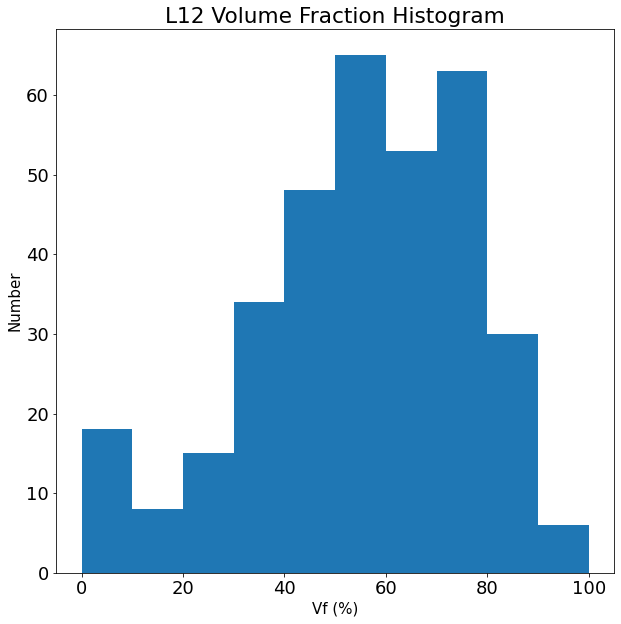

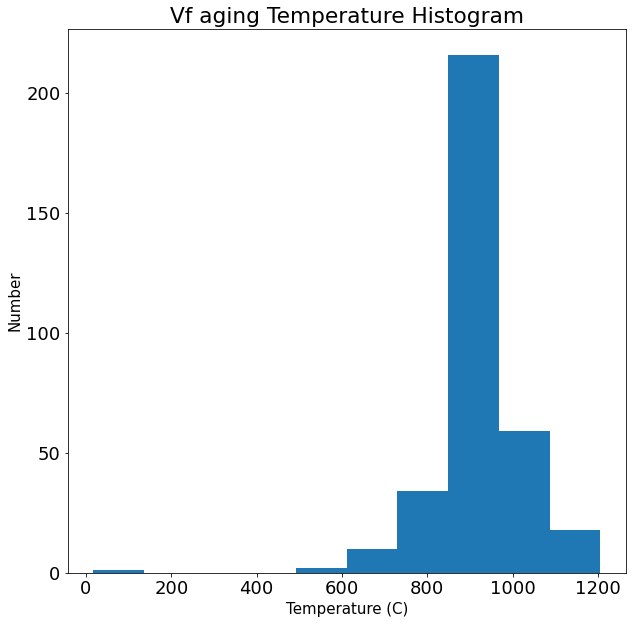

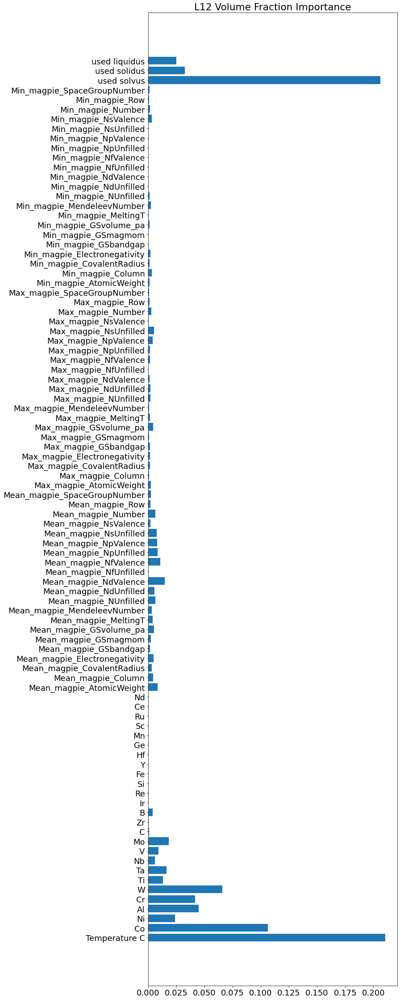

In [30]:
#generates Vf prediction, it is important for test_fit and plot_fit to be False, so that 100% training data is used
ML_Vf = predict_ML_Vf(input_df = data,
                              raw_file='ML-Co-input_Vf.csv',
                              plot_histogram=True,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

In [31]:
def make_Vf_summary_table(num_states):
    summary_table = pd.DataFrame()
    
    #this makes a column with no test data split
    summary_table['ML_Vf_input'] = ML_Vf = predict_ML_Vf(input_df = data,
                              raw_file='ML-Co-input_Vf.csv',
                              test_fit=False,
                              plot_fit=False, 
                              plot_histogram=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #this makes num_states columns with 90-10 data splits
    for i in range(num_states):
        ML_Vf = predict_ML_Vf(input_df = data,
                              raw_file='ML-Co-input_Vf.csv',
                              test_fit=True,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=i,
                              random_state2=0)

        summary_table[i+1] = ML_Vf
        summary_table = summary_table.copy()
        
    #now I can check the average, variance, etc. of how test data splits affect the final result
    
    return summary_table

In [32]:
#creating Vf summary table assuming 100 different training/test splits and seeing the differences in output

#allow turning this off to save time

generate_Vf_summary_table = False

if generate_Vf_summary_table == True:
    Vf_summary = make_Vf_summary_table(100)
    
    #giving some statistics, axis = 1 means rows, axis = 0 would be columns
    Vf_summary['mean'] = Vf_summary.mean(axis=1)
    Vf_summary['max']= Vf_summary.max(axis=1)
    Vf_summary['min']= Vf_summary.min(axis=1)
    Vf_summary['st dev']= Vf_summary.std(axis=1)

    Vf_summary
    Vf_summary.to_excel('Vf_MLoutput.xlsx', header=True, index=True)
    
    plt.rcParams["figure.figsize"] = (10,10)
    Vf_summary.plot(y='st dev', use_index=True)
    plt.xlabel('Alloy Index')
    plt.ylabel('Standard Deviation')
    plt.title('Standard Deviation')

    fig,ax=plt.subplots()
    ax.plot(range(0,Vf_summary.shape[0]),Vf_summary['ML_Vf_input']-Vf_summary['mean'])
    #ax.plot(range(0,334),misfit_summary['mean'], color ='r')
    ax.set_xlabel("Alloy Index")
    ax.set_ylabel("Difference Between Final Value and Average")
    ax.set_title("Average Accuracy")

In [33]:
#adds a new column to "data" dataframe with ML-predicted Vf
data['ML Vf']= ML_Vf

tempVf_data = pd.read_csv('ML-Co-input_Vf.csv',encoding='ANSI')
tempVf_data = tempVf_data.drop_duplicates(subset=['Shortname', 'Temperature C'], keep='first')

comparison_data=[]
comparison_data = pd.merge(data, 
                           tempVf_data[['Shortname', 'Temperature C', 'Vf']], 
                           on=['Shortname', 'Temperature C'], 
                           how="left")

data['used Vf']= comparison_data['Vf']
data['used Vf']=data['used Vf'].fillna(data['ML Vf'])



C:\Users\brand\anaconda3\lib\site-packages\pandas\core\reshape\merge.py:1215: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


In [34]:
def predict_ML_hardness(input_df, raw_file, plot_histogram, test_fit, plot_fit, plot_importance, random_state1, random_state2):

    #input_df is the creep data, which the model will "test"
    #raw_file is the string for data including solidus, which the model will train
    #test_fit is bool, if True it will split misfit into test/training
    #plot_fit is bool, if True it graphs the fit
    #plot_importance is bool, if True it will plot importance
    #random_state allows control of random variables, in most cases it will be random_state=0

    #when defined as a function, these will be given in the call
    #input_df = input_df
    #raw_file = 'ML-Co-input_hardness'
    #test_fit = True
    #plot_importance = True
    #random_state1 = 0
    #random_state2 = 0


    #takes the location of the misfit file and makes a dataframe "raw_data"
    raw_data = pd.read_csv(raw_file,encoding='ANSI')


    #converts unrecognized values into 0
    raw_data = raw_data.fillna(0)

    #for now, only consider room temp hardness. Also ignore aging temp for now.
    raw_data.drop(raw_data.loc[raw_data['Test Temperature C']!=25].index, inplace=True)

    #drop columns from data
    raw_data = raw_data.drop(columns=['Test Temperature C','Aging Temperature C','Index', 'Name','Paper'])

    magpie_names = get_chem_only_descriptors(formula=raw_data.Shortname[0], source="magpie")[1]
    raw_data[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in raw_data['Shortname']]

    #split data into test and training if desired
    #"random_state" is defined in the function so that this number can be cycled if desired 
    

    
    if plot_histogram == True:
        plt.figure(figsize=(10,10))
        plt.hist(raw_data['Hardness HV'])
        plt.xlabel('Hardness (HV)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Hardness Histogram")
        plt.show()
        
    if test_fit == True:
        data_train, data_test = train_test_split(raw_data, test_size=0.1, random_state=random_state1)

        Y_train = data_train['Hardness HV'].tolist()
        X_train = data_train.drop(columns = ["Shortname", "Hardness HV"])
        Y_test = data_test['Hardness HV'].tolist()
        X_test = data_test.drop(columns = ["Shortname","Hardness HV"])


    else:
        data_train = raw_data

        Y_train = data_train['Hardness HV'].tolist()
        X_train = data_train.drop(columns = ["Shortname","Hardness HV"])
        X_test = []
        Y_test = []

    regr = RandomForestRegressor(n_estimators=3000, max_depth=15, random_state = random_state2).fit(X_train, Y_train)
    
    if test_fit == True:
        Y_pred = regr.predict(X_test)

    if plot_importance == True:
        # summarize feature importance
        importance = regr.feature_importances_
        #for i,v in enumerate(importance0):
            #print('Feature: %0d, Score: %.5f' % (i,v))          

        plt.rcParams["figure.figsize"] = (10,40)
        plt.barh(X_train.columns, importance)
        plt.title("Hardness Importance")
        plt.show()

    if test_fit == True and plot_fit ==True:
        MSE_misfit = mean_squared_error(Y_test, Y_pred, squared=True)
        print(f"MSE: {'{:.2e}'.format(MSE_misfit)}")

        Y_test_percent = result = [i for i in Y_test]
        Y_pred_percent = result = [i for i in Y_pred]

        plt.figure(figsize=(10,10))
        plt.scatter(Y_test_percent, Y_pred_percent, c='crimson')
        plt.errorbar(Y_test_percent, Y_pred_percent, xerr=50, c='crimson', fmt="o")

        p1 = max(max(Y_pred_percent), max(Y_test_percent))
        p2 = min(min(Y_pred_percent), min(Y_test_percent))
        plt.plot([p1, p2], [p1, p2], 'b-')
        plt.xlabel('Hardness (HV)', fontsize=15)
        plt.ylabel('Predictions (HV)', fontsize=15)
        plt.title(f"MSE: {'{:.2e}'.format(MSE_misfit)}")
        plt.axis('equal')
        plt.show()

        #Make more detailed plot
        raw_results = X_test
        raw_results['shortname']= raw_data['Shortname']
        raw_results['Y_pred'] = Y_pred
        raw_results['Y_test'] = Y_test

        fig2 = px.scatter(raw_results, x= "Y_test", y="Y_pred", hover_name = "shortname")

        fig2.update_traces(marker=dict(size=15,
                                      line=dict(width=2,)),
                          selector=dict(mode='markers'))




        fig2.add_trace(
            go.Scatter(
                y=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                x=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                mode="lines",
                line=go.scatter.Line(color="red"),
                showlegend=False)
        )

        fig2.show()

    input_df = input_df[['Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 
                         'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd',
                         'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 
                         'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 
                         'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 
                         'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 
                         'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 
                         'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 
                         'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 
                         'Max_magpie_AtomicWeight', 'Max_magpie_Column', 'Max_magpie_CovalentRadius', 
                         'Max_magpie_Electronegativity', 'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 
                         'Max_magpie_GSvolume_pa', 'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 
                         'Max_magpie_NUnfilled', 'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 
                         'Max_magpie_NfUnfilled', 'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 
                         'Max_magpie_NpValence', 'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 
                         'Max_magpie_Number', 'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 
                         'Min_magpie_AtomicWeight', 'Min_magpie_Column', 'Min_magpie_CovalentRadius', 
                         'Min_magpie_Electronegativity', 'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 
                         'Min_magpie_GSvolume_pa', 'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 
                         'Min_magpie_NUnfilled', 'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 
                         'Min_magpie_NfUnfilled', 'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 
                         'Min_magpie_NpValence', 'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 
                         'Min_magpie_Number', 'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber']]
        
#     input_df = input_df.drop(columns = ["Shortname","Stress (MPa)","Strain Rate (min) /s", "Time to 1% strain (s)",
#                                        "log(time)", "Sol. Temp (ºC)","Sol. Time (h)", "1 age temp (ºC)", "1 age time (h)",
#                                        "2 age temp (ºC)", "2 age time (hr)", "C/T", "Orientation", "VolFrac (%)", 
#                                         "Deff = sum DI","Temperature C" ])
    raw_pred = regr.predict(input_df)

    return raw_pred


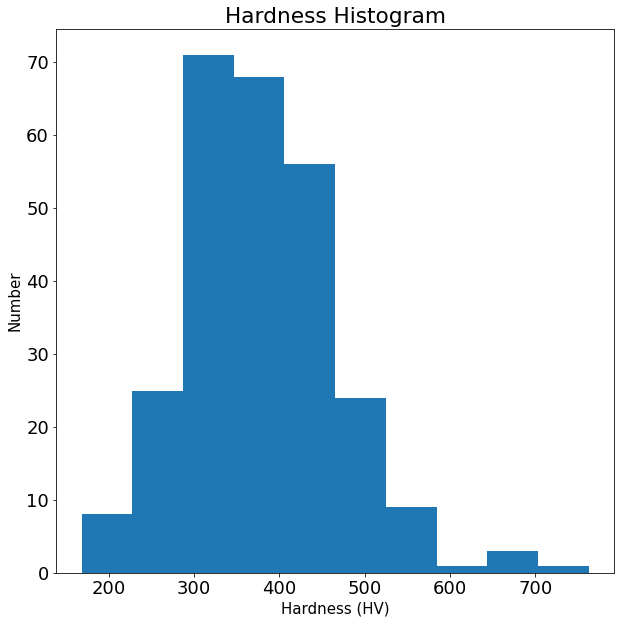

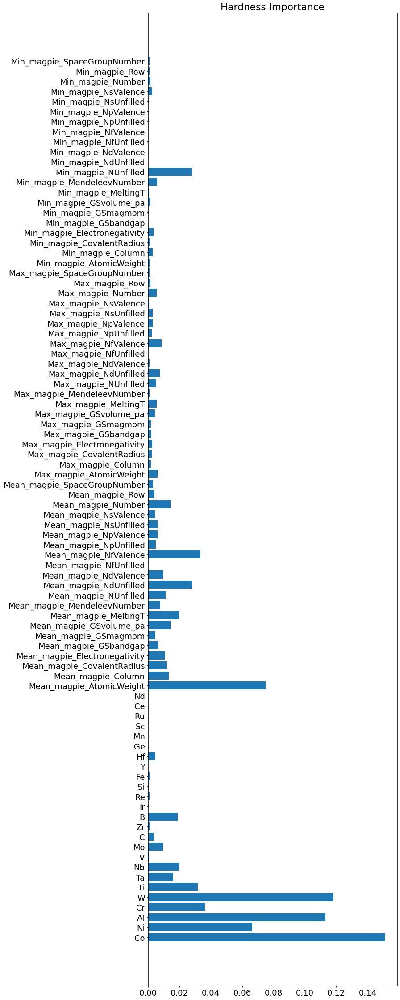

In [35]:
#generates hardness prediction, it is important for test_fit and plot_fit to be False, so that 100% training data is used
ML_hardness = predict_ML_hardness(input_df = input_df0,
                              raw_file='ML-Co-input_hardness.csv',
                              plot_histogram=True, 
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

In [36]:
def make_hardness_summary_table(num_states):
    summary_table = pd.DataFrame()
    
    #this makes a column with no test data split
    summary_table['ML_hardness_input'] = ML_hardness = predict_ML_hardness(input_df = input_df0,
                              raw_file='ML-Co-input_hardness.csv',
                              test_fit=False,
                              plot_histogram=False,
                              plot_fit=False,                                       
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #this makes num_states columns with 90-10 data splits
    for i in range(num_states):
        ML_hardness = predict_ML_hardness(input_df = input_df0,
                              raw_file='ML-Co-input_hardness.csv',
                              test_fit=True,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=i,
                              random_state2=0)

        summary_table[i+1] = ML_hardness
        summary_table = summary_table.copy()
        
    #now I can check the average, variance, etc. of how test data splits affect the final result
    
    return summary_table

In [37]:
#creating hardness summary table assuming 100 different training/test splits and seeing the differences in output

#allow turning this off to save time

generate_hardness_summary_table = False

if generate_hardness_summary_table == True:
    hardness_summary = make_hardness_summary_table(100)
    
    #giving some statistics, axis = 1 means rows, axis = 0 would be columns
    hardness_summary['mean'] = hardness_summary.mean(axis=1)
    hardness_summary['max']= hardness_summary.max(axis=1)
    hardness_summary['min']= hardness_summary.min(axis=1)
    hardness_summary['st dev']= hardness_summary.std(axis=1)

    hardness_summary
    hardness_summary.to_excel('hardness_MLoutput.xlsx', header=True, index=True)
    
    plt.rcParams["figure.figsize"] = (10,10)
    hardness_summary.plot(y='st dev', use_index=True)
    plt.xlabel('Alloy Index')
    plt.ylabel('Standard Deviation')
    plt.title('Standard Deviation')

    fig,ax=plt.subplots()
    ax.plot(range(0,hardness_summary.shape[0]),hardness_summary['ML_hardness_input']-hardness_summary['mean'])
    #ax.plot(range(0,334),misfit_summary['mean'], color ='r')
    ax.set_xlabel("Alloy Index")
    ax.set_ylabel("Difference Between Final Value and Average")
    ax.set_title("Average Accuracy")

In [38]:
#adds a new column to "data" dataframe with ML-predicted hardness
data['ML hardness']= ML_hardness

temphardness_data = pd.read_csv('ML-Co-input_hardness.csv',encoding='ANSI')
temphardness_data = temphardness_data.drop_duplicates(subset=['Shortname'])

comparison_data=[]
#at some point make more robust model so hardness depends on aging/test temp?
comparison_data = pd.merge(data, temphardness_data[['Shortname','Hardness HV']], on=['Shortname'], how="left")

data['used hardness']= comparison_data['Hardness HV']
data['used hardness']=data['used hardness'].fillna(data['ML hardness'])

In [39]:
def predict_ML_YS(input_df, raw_file, plot_histogram, test_fit, plot_fit, plot_importance, random_state1, random_state2):

    #input_df is the creep data, which the model will "test"
    #raw_file is the string for data including solidus, which the model will train
    #test_fit is bool, if True it will split misfit into test/training
    #plot_fit is bool, if True it graphs the fit
    #plot_importance is bool, if True it will plot importance
    #random_state allows control of random variables, in most cases it will be random_state=0

    #when defined as a function, these will be given in the call
    #input_df = input_df
    #raw_file = 'ML-Co-input_YS'
    #test_fit = True
    #plot_importance = True
    #random_state1 = 0
    #random_state2 = 0


    #takes the location of the misfit file and makes a dataframe "raw_data"
    raw_data = pd.read_csv(raw_file,encoding='ANSI')


    #converts unrecognized values into 0
    raw_data = raw_data.fillna(0)

    #drop columns from data
    raw_data = raw_data.drop(columns=['Index', 'Name','Paper','Strain rate /s','Compression/Tension','Notes'])

    magpie_names = get_chem_only_descriptors(formula=raw_data.Shortname[0], source="magpie")[1]
    raw_data[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in raw_data['Shortname']]
    #add misfit, solvus, solidus, liquidus, not hardness?
       
    #predicting misfit on YS data
    ML_raw_misfit = predict_ML_misfit(input_df = raw_data.drop(columns=['Yield Stress']),
                              misfit_file='ML-Co-input_lattice misfit.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    raw_data['ML misfit']=ML_raw_misfit
    tempmisfit_data = pd.read_csv('ML-Co-input_lattice misfit.csv',encoding='ANSI')
    tempmisfit_data = tempmisfit_data.drop_duplicates(subset=['Shortname', 'Temperature C'], keep='first')
    

    #print(raw_data.isna().sum().sum())
    
    comparison_data=[]
    comparison_data = pd.merge(raw_data, 
                           tempmisfit_data[['Shortname', 'Temperature C', 'misfit']], 
                           on=['Shortname', 'Temperature C'], 
                           how="left")
    raw_data['used misfit']=comparison_data['misfit']
    raw_data['used misfit']=raw_data['used misfit'].fillna(raw_data['ML misfit'])
    raw_data=raw_data.drop(columns=['ML misfit'])


    
    
    #predicting solvus on YS data
    ML_raw_solvus = predict_ML_solvus(input_df = raw_data,
                              raw_file='ML-Co-input_solvus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    raw_data['ML solvus']=ML_raw_solvus
    tempsolvus_data = pd.read_csv('ML-Co-input_solvus_only.csv',encoding='ANSI')
    tempsolvus_data = tempsolvus_data.drop_duplicates(subset=['Shortname'])

    comparison_data=[]
    comparison_data = pd.merge(raw_data, tempsolvus_data[['Shortname', 'solvus']], on=['Shortname'], how="left")
    raw_data['used solvus']=comparison_data['solvus']
    raw_data['used solvus']=raw_data['used solvus'].fillna(raw_data['ML solvus'])
    raw_data=raw_data.drop(columns=['ML solvus'])
    
    #predicting solidus on YS data
    ML_raw_solidus = predict_ML_solidus(input_df = raw_data,
                              raw_file='ML-Co-input_solidus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    raw_data['ML solidus']=ML_raw_solidus
    tempsolidus_data = pd.read_csv('ML-Co-input_solidus_only.csv',encoding='ANSI')
    tempsolidus_data = tempsolidus_data.drop_duplicates(subset=['Shortname'])
    comparison_data=[]
    comparison_data = pd.merge(raw_data, tempsolidus_data[['Shortname', 'solidus']], on=['Shortname'], how="left")
    raw_data['used solidus']=comparison_data['solidus']
    raw_data['used solidus']=raw_data['used solidus'].fillna(raw_data['ML solidus'])
    raw_data=raw_data.drop(columns=['ML solidus'])
    
    #predicting liquidus on YS data
    ML_raw_liquidus = predict_ML_liquidus(input_df = raw_data,
                              raw_file='ML-Co-input_liquidus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0) 
    
    raw_data['ML liquidus']=ML_raw_liquidus
    templiquidus_data = pd.read_csv('ML-Co-input_liquidus_only.csv',encoding='ANSI')
    templiquidus_data = templiquidus_data.drop_duplicates(subset=['Shortname'])
    comparison_data=[]
    comparison_data = pd.merge(raw_data, templiquidus_data[['Shortname', 'liquidus']], on=['Shortname'], how="left")
    raw_data['used liquidus']=comparison_data['liquidus']
    raw_data['used liquidus']=raw_data['used liquidus'].fillna(raw_data['ML liquidus'])
    raw_data=raw_data.drop(columns=['ML liquidus'])
    
    #predicting Vf on hardness data
    ML_raw_Vf = predict_ML_Vf(input_df = raw_data,
                              raw_file='ML-Co-input_Vf.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    raw_data['ML Vf']=ML_raw_Vf
    tempVf_data = pd.read_csv('ML-Co-input_Vf.csv',encoding='ANSI')
    tempVf_data = tempVf_data.drop_duplicates(subset=['Shortname', 'Temperature C'], keep='first')
    
    comparison_data=[]
    comparison_data = pd.merge(raw_data, 
                           tempVf_data[['Shortname', 'Temperature C', 'Vf']], 
                           on=['Shortname', 'Temperature C'], 
                           how="left")
    raw_data['used Vf']=comparison_data['Vf']
    raw_data['used Vf']=raw_data['used Vf'].fillna(raw_data['ML Vf'])
    raw_data=raw_data.drop(columns=['ML Vf'])


    #split data into test and training if desired
    #"random_state" is defined in the function so that this number can be cycled if desired 

    
    if plot_histogram == True:
        plt.figure(figsize=(10,10))
        plt.hist(raw_data['Yield Stress'])
        plt.xlabel('YS (MPa)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Yield Stress Histogram")
        plt.show()
        
        plt.figure(figsize=(10,10))
        plt.hist(raw_data['Temperature C'])
        plt.xlabel('Temperature (C)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("YS Temperature Histogram")
        plt.show()
        
    if test_fit == True:
        data_train, data_test = train_test_split(raw_data, test_size=0.1, random_state=random_state1)

        Y_train = data_train['Yield Stress'].tolist()
        X_train = data_train.drop(columns = ["Shortname", "Yield Stress"])
        Y_test = data_test['Yield Stress'].tolist()
        X_test = data_test.drop(columns = ["Shortname","Yield Stress"])


    else:
        data_train = raw_data

        Y_train = data_train['Yield Stress'].tolist()
        X_train = data_train.drop(columns = ["Shortname","Yield Stress"])
        X_test = []
        Y_test = []

    
    regr = RandomForestRegressor(n_estimators=3000, max_depth=15, random_state = random_state2).fit(X_train, Y_train)
    
    if test_fit == True:
        Y_pred = regr.predict(X_test)

    if plot_importance == True:
        # summarize feature importance
        importance = regr.feature_importances_
        #for i,v in enumerate(importance0):
            #print('Feature: %0d, Score: %.5f' % (i,v))          

        plt.rcParams["figure.figsize"] = (10,40)
        plt.barh(X_train.columns, importance)
        plt.title("Yield Strength Importance")
        plt.show()

    if test_fit == True and plot_fit ==True:
        MSE_misfit = mean_squared_error(Y_test, Y_pred, squared=True)
        print(f"MSE: {'{:.2e}'.format(MSE_misfit)}")

        Y_test_percent = result = [i for i in Y_test]
        Y_pred_percent = result = [i for i in Y_pred]

        plt.figure(figsize=(10,10))
        plt.scatter(Y_test_percent, Y_pred_percent, c='crimson')
        plt.errorbar(Y_test_percent, Y_pred_percent, xerr=100, c='crimson', fmt="o")

        p1 = max(max(Y_pred_percent), max(Y_test_percent))
        p2 = min(min(Y_pred_percent), min(Y_test_percent))
        plt.plot([p1, p2], [p1, p2], 'b-')
        plt.xlabel('Yield Stress', fontsize=15)
        plt.ylabel('Predictions (MPa)', fontsize=15)
        plt.title(f"MSE: {'{:.2e}'.format(MSE_misfit)}")
        plt.axis('equal')
        plt.show()

        #Make more detailed plot
        raw_results = X_test
        raw_results['shortname']= raw_data['Shortname']
        raw_results['Y_pred'] = Y_pred
        raw_results['Y_test'] = Y_test

        fig2 = px.scatter(raw_results, x= "Y_test", y="Y_pred", color = "Temperature C", hover_name = "shortname",
                          hover_data = [
                             "Temperature C"
                         ])

        fig2.update_traces(marker=dict(size=15,
                                      line=dict(width=2,)),
                          selector=dict(mode='markers'))




        fig2.add_trace(
            go.Scatter(
                y=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                x=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
                mode="lines",
                line=go.scatter.Line(color="red"),
                showlegend=False)
        )

        fig2.show()
        
    input_df = input_df[['Temperature C', 
                         'Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 
                         'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd',
                         'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 
                         'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 
                         'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 
                         'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 
                         'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 
                         'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 
                         'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 
                         'Max_magpie_AtomicWeight', 'Max_magpie_Column', 'Max_magpie_CovalentRadius', 
                         'Max_magpie_Electronegativity', 'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 
                         'Max_magpie_GSvolume_pa', 'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 
                         'Max_magpie_NUnfilled', 'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 
                         'Max_magpie_NfUnfilled', 'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 
                         'Max_magpie_NpValence', 'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 
                         'Max_magpie_Number', 'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 
                         'Min_magpie_AtomicWeight', 'Min_magpie_Column', 'Min_magpie_CovalentRadius', 
                         'Min_magpie_Electronegativity', 'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 
                         'Min_magpie_GSvolume_pa', 'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 
                         'Min_magpie_NUnfilled', 'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 
                         'Min_magpie_NfUnfilled', 'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 
                         'Min_magpie_NpValence', 'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 
                         'Min_magpie_Number', 'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber',
                        'used misfit', 'used solvus', 'used solidus', 'used liquidus', 'used Vf']]

#     input_df = input_df.drop(columns = ["Shortname","Stress (MPa)","Strain Rate (min) /s", "Time to 1% strain (s)",
#                                        "log(time)", "Sol. Temp (ºC)","Sol. Time (h)", "1 age temp (ºC)", "1 age time (h)",
#                                        "2 age temp (ºC)", "2 age time (hr)", "C/T", "Orientation", "VolFrac (%)", 
#                                         "Deff = sum DI"])
    
    #print(list(input_df.columns))
    
    raw_pred = regr.predict(input_df)

    return raw_pred


C:\Users\brand\anaconda3\lib\site-packages\pandas\core\reshape\merge.py:1205: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


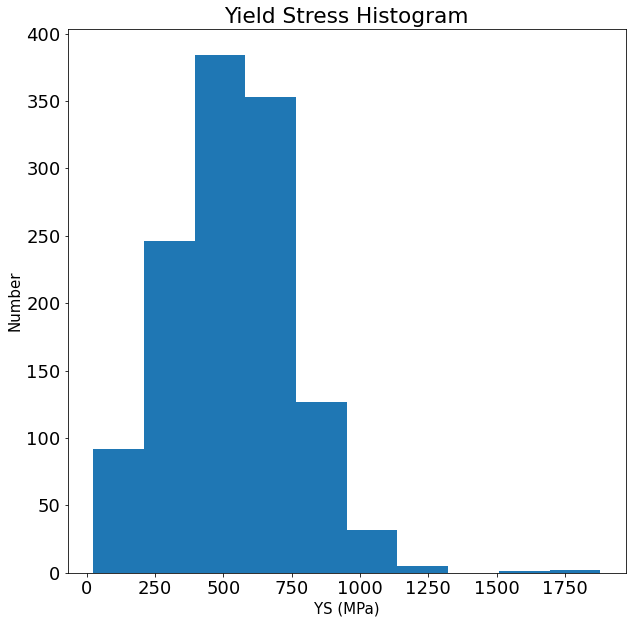

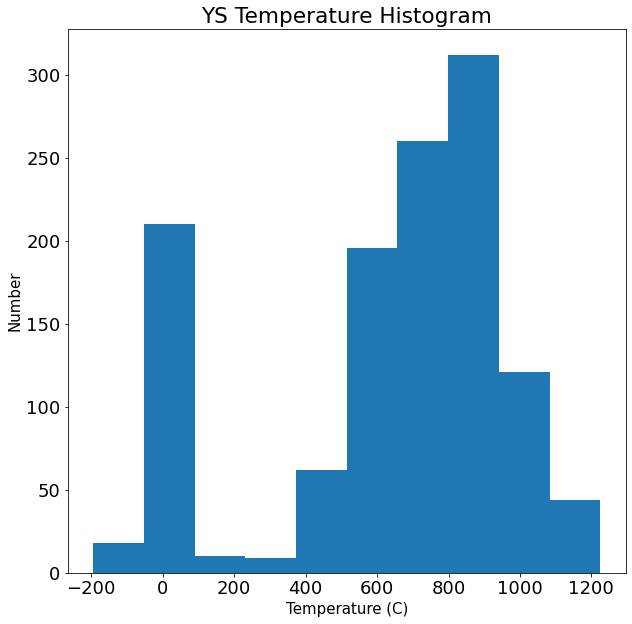

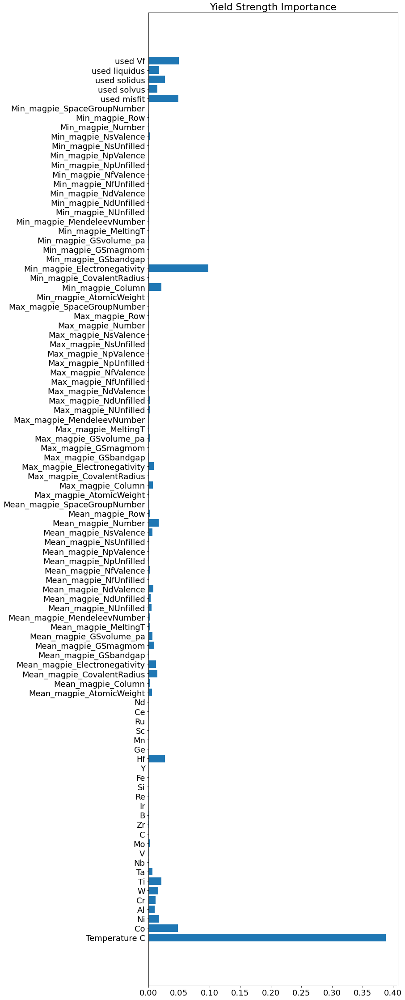

In [40]:
#generates YS prediction, it is important for test_fit and plot_fit to be False, so that 100% training data is used
ML_YS = predict_ML_YS(input_df = data,
                              raw_file='ML-Co-input_YS.csv',
                              plot_histogram=True,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

In [41]:
def make_YS_summary_table(num_states):
    summary_table = pd.DataFrame()
    
    #this makes a column with no test data split
    summary_table['ML_YS_input'] = ML_YS = predict_ML_YS(input_df = data,
                              raw_file='ML-Co-input_YS.csv',
                              test_fit=False,
                              plot_fit=False, 
                              plot_histogram=False,
                              plot_importance=False,
                              random_state1=0,
                              random_state2=0)
    
    #this makes num_states columns with 90-10 data splits
    for i in range(num_states):
        ML_YS = predict_ML_YS(input_df = data,
                              raw_file='ML-Co-input_YS.csv',
                              test_fit=True,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=False,
                              random_state1=i,
                              random_state2=0)

        summary_table[i+1] = ML_YS
        summary_table = summary_table.copy()
        
    #now I can check the average, variance, etc. of how test data splits affect the final result
    
    return summary_table

In [42]:
#creating YS summary table assuming 100 different training/test splits and seeing the differences in output

#allow turning this off to save time

generate_YS_summary_table = False

if generate_YS_summary_table == True:
    YS_summary = make_YS_summary_table(100)
    
    #giving some statistics, axis = 1 means rows, axis = 0 would be columns
    YS_summary['mean'] = YS_summary.mean(axis=1)
    YS_summary['max']= YS_summary.max(axis=1)
    YS_summary['min']= YS_summary.min(axis=1)
    YS_summary['st dev']= YS_summary.std(axis=1)

    YS_summary
    YS_summary.to_excel('YS_MLoutput.xlsx', header=True, index=True)
    
    plt.rcParams["figure.figsize"] = (10,10)
    YS_summary.plot(y='st dev', use_index=True)
    plt.xlabel('Alloy Index')
    plt.ylabel('Standard Deviation')
    plt.title('Standard Deviation')

    fig,ax=plt.subplots()
    ax.plot(range(0,YS_summary.shape[0]),YS_summary['ML_YS_input']-YS_summary['mean'])
    #ax.plot(range(0,334),misfit_summary['mean'], color ='r')
    ax.set_xlabel("Alloy Index")
    ax.set_ylabel("Difference Between Final Value and Average")
    ax.set_title("Average Accuracy")

In [43]:
#adds a new column to "data" dataframe with ML-predicted solvus
data['ML YS']= ML_YS

tempYS_data = pd.read_csv('ML-Co-input_YS.csv',encoding='ANSI')
tempYS_data = tempYS_data.drop_duplicates(subset=['Shortname', 'Temperature C'], keep='first')

comparison_data=[]
comparison_data = pd.merge(data, 
                           tempYS_data[['Shortname', 'Temperature C', 'Yield Stress']], 
                           on=['Shortname', 'Temperature C'], 
                           how="left")

data['used YS']= comparison_data['Yield Stress']
data['used YS']=data['used YS'].fillna(data['ML YS'])

C:\Users\brand\anaconda3\lib\site-packages\pandas\core\reshape\merge.py:1215: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


In [44]:
print(data)
#print(list(data.columns))
#print(len(list(data.columns)))
data.to_csv('output_intermediary_properties.csv')

                                       Shortname  Stress (MPa)  \
0                                  Co-8.1Al-8.4W    250.000000   
1                                  Co-8.1Al-8.4W    350.000000   
2                                  Co-8.1Al-8.4W    400.000000   
3                                  Co-8.1Al-8.4W    450.000000   
4                                  Co-8.1Al-8.4W    500.000000   
..                                           ...           ...   
532  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B    254.290730   
533  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B    299.028230   
534  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B    354.393492   
535  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B    409.482790   
536  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B    473.135536   

     Strain Rate (min) /s  Time to 1% strain (s)  log(time)  Temperature C  \
0            5.190000e-07           19267.822740   4.284833            850   
1            3.510000e-08          284900.284900   

In [45]:
#Here is where I would replace data with alt_data which has the calphad numbers
#TODO alt_data = new dataset with calphad values instead of ML values

#data = alt_data.copy()

['Shortname', 'Stress (MPa)', 'Strain Rate (min) /s', 'Time to 1% strain (s)', 'log(time)', 'Temperature C', 'Sol. Temp (ºC)', 'Sol. Time (h)', '1 age temp (ºC)', '1 age time (h)', '2 age temp (ºC)', '2 age time (hr)', 'C/T', 'Orientation', 'VolFrac (%)', 'Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd', 'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 'Max_magpie_AtomicWeight', 'Max_magpie_Column', 'Max_

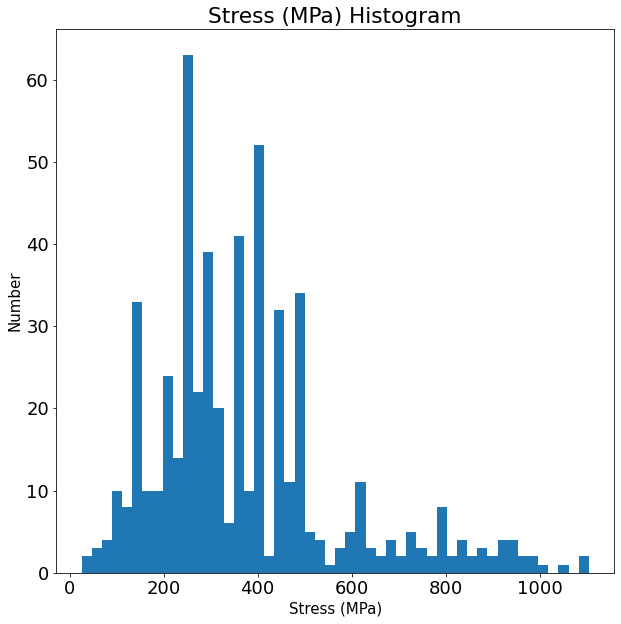

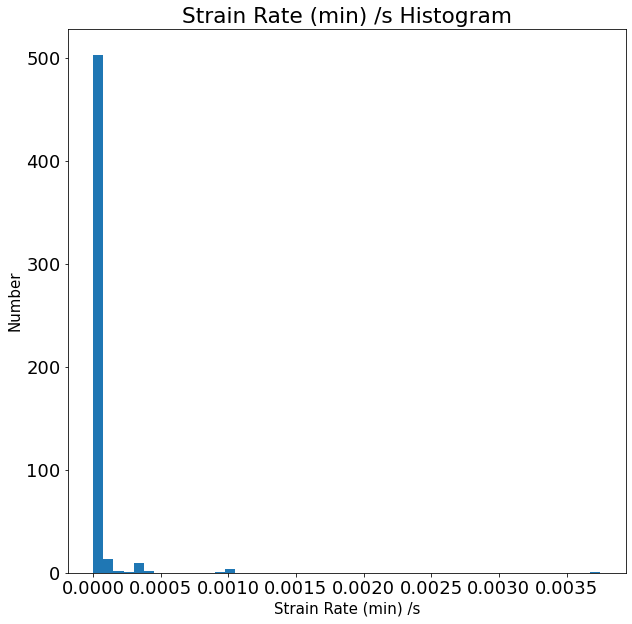

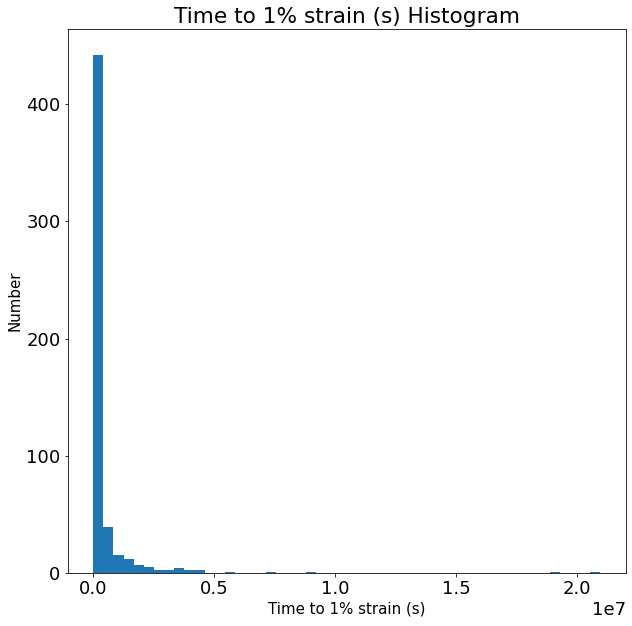

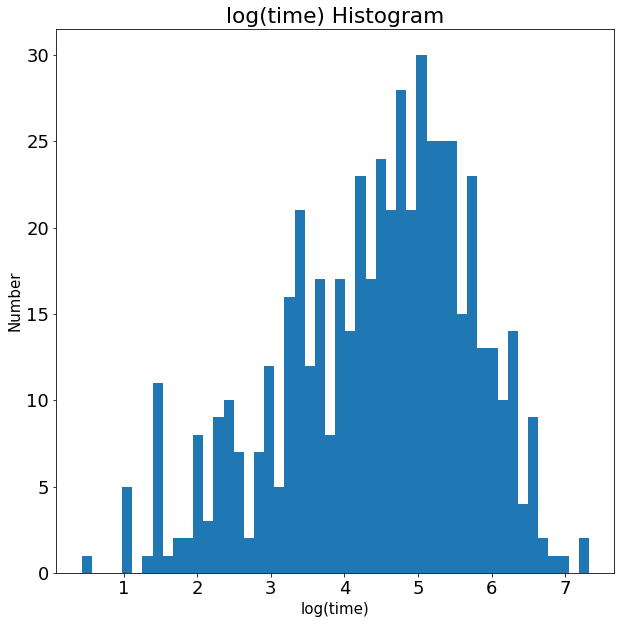

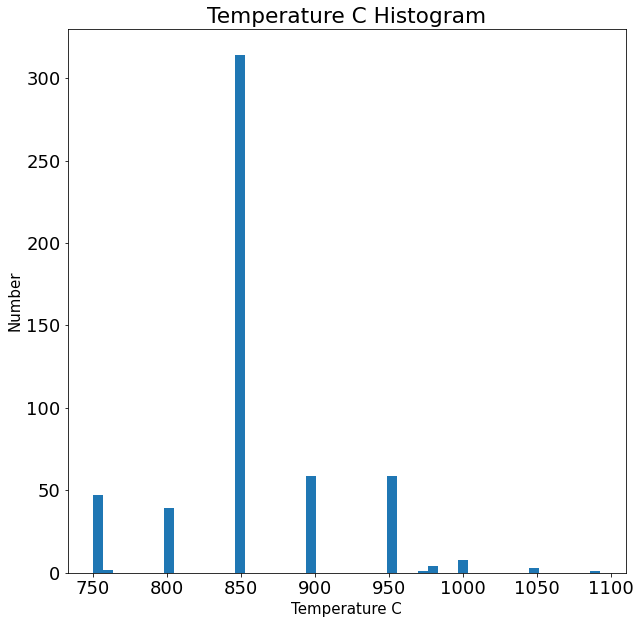

...

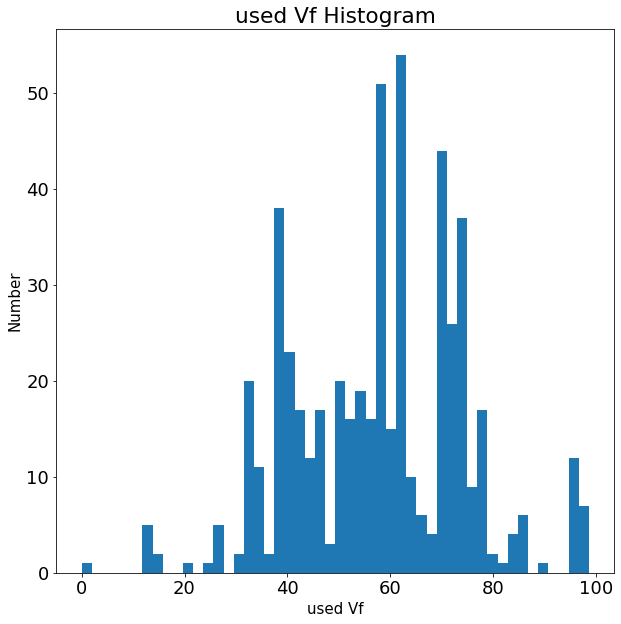

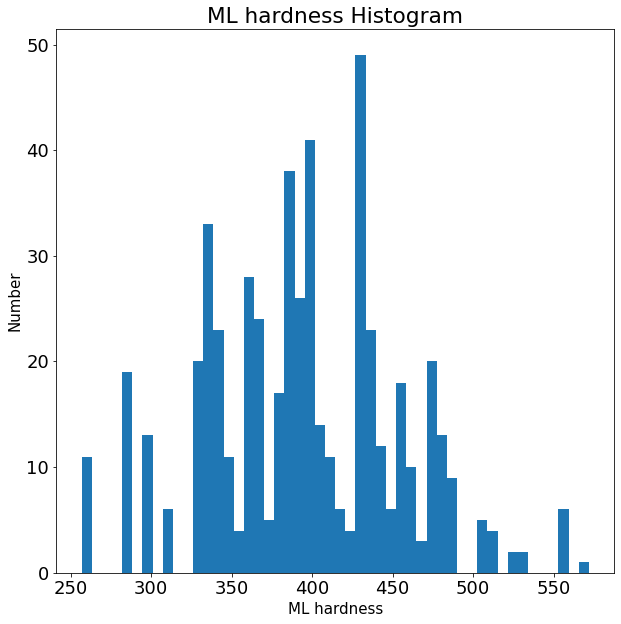

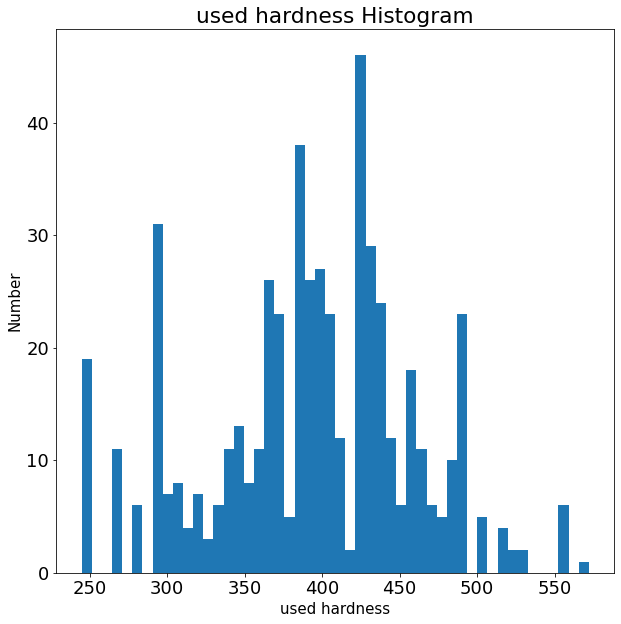

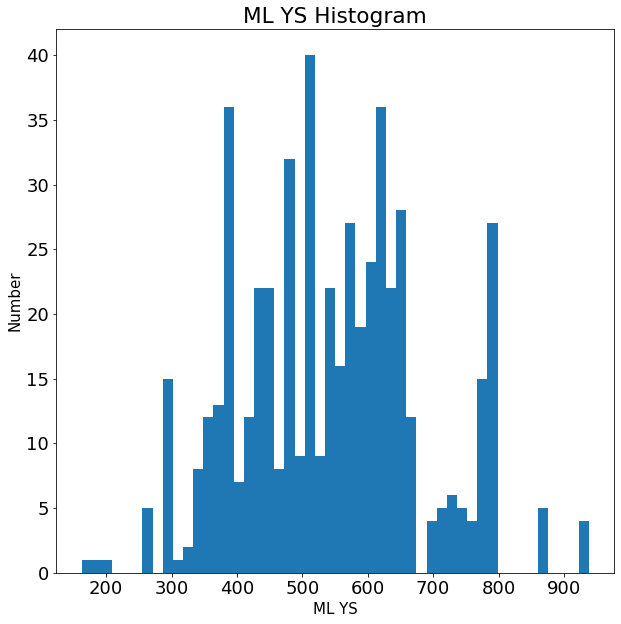

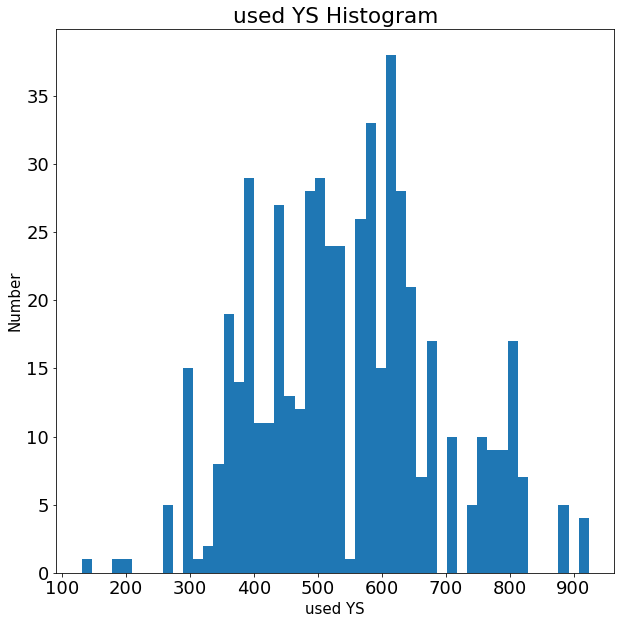

In [46]:
#print(data)

histogram_creep_cols=data.columns.tolist().copy()
print(histogram_creep_cols)
plot_big_histogram = True

if plot_big_histogram == True:
    for i in range(1,len(histogram_creep_cols)):
        hist_title=data.columns[i]
        
        plt.figure(figsize=(10,10))
        plt.hist(data[f'{data.columns[i]}'],bins=50)
        plt.xlabel(hist_title, fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title(f"{hist_title} Histogram")
        plt.show()
    
#         plt.figure(figsize=(10,10))
#         plt.hist(input_df['Stress (MPa)'])
#         plt.xlabel('Stress (MPa)', fontsize=15)
#         plt.ylabel('Number', fontsize=15)
#         plt.title("Stress Histogram")
#         plt.show()
        
#         plt.figure(figsize=(10,10))
#         plt.hist(input_df['Strain Rate (min) /s'])
#         plt.xlabel('Strain Rate (/s)', fontsize=15)
#         plt.ylabel('Number', fontsize=15)
#         plt.title("Strain Rate Histogram")
#         plt.show()
        
#         plt.figure(figsize=(10,10))
#         plt.hist(input_df['Temperature C'])
#         plt.xlabel('Temperature (C)', fontsize=15)
#         plt.ylabel('Number', fontsize=15)
#         plt.title("Temperature Histogram")
#         plt.show()

In [67]:
def predict_creep_life(input_df,
                       new_prediction,
                       plot_histogram,
                       random_state1, 
                       random_state2, 
                       random_state3, 
                       n_clusters, 
                       elbowplot, 
                       plot_importance,
                       plotresult):
    
    #plot histograms for stress, strain rate, and temperature input          
    if plot_histogram == True:
        plt.figure(figsize=(10,10))
        plt.hist(input_df['Stress (MPa)'])
        plt.xlabel('Stress (MPa)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Stress Histogram")
        plt.show()
        
        plt.figure(figsize=(10,10))
        plt.hist(input_df['Strain Rate (min) /s'])
        plt.xlabel('Strain Rate (/s)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Strain Rate Histogram")
        plt.show()
        
        plt.figure(figsize=(10,10))
        plt.hist(input_df['Temperature C'])
        plt.xlabel('Temperature (C)', fontsize=15)
        plt.ylabel('Number', fontsize=15)
        plt.title("Temperature Histogram")
        plt.show()
        
    #split input_df into test and training
    #"random_state1" is defined in the function so that this number can be cycled later 
    
    #if 'new_prediction' is supplied, data uses 100% training data and 'new_prediction' for test data
    if new_prediction.shape[0] == 0:
        data_train, data_test = train_test_split(input_df, test_size=0.1, random_state=random_state1)
    else:
        data_train = input_df
        data_test = new_prediction
    #print(f"data_test is {data_test}")
    
    #"data_train" is now the set with (1-test_size) fraction of the data, and "data_test" has test_size fraction of the data
    
    #HERE I add code which replaces data_test with my own set of data
    
    #print(data_train)
    
    #specify which variables in "data_train" will not be used in cluster model
    
    cluster_params = list(data_train[['Temperature C', 'Sol. Temp (ºC)', 
                                      'Sol. Time (h)', '1 age temp (ºC)', '1 age time (h)', '2 age temp (ºC)', 
                                      '2 age time (hr)', 'C/T', 'Orientation', 'Co', 'Ni', 'Al', 
                                      'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 'B', 'Ir', 'Re', 'Si', 
                                      'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd', 'Mean_magpie_AtomicWeight', 
                                      'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 'Mean_magpie_Electronegativity', 
                                      'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 'Mean_magpie_GSvolume_pa', 
                                      'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 'Mean_magpie_NUnfilled', 
                                      'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 'Mean_magpie_NfUnfilled', 
                                      'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 'Mean_magpie_NpValence', 
                                      'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 'Mean_magpie_Number', 
                                      'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 'Max_magpie_AtomicWeight', 
                                      'Max_magpie_Column', 'Max_magpie_CovalentRadius', 'Max_magpie_Electronegativity', 
                                      'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 'Max_magpie_GSvolume_pa', 
                                      'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 'Max_magpie_NUnfilled', 
                                      'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 'Max_magpie_NfUnfilled', 
                                      'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 'Max_magpie_NpValence', 
                                      'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 'Max_magpie_Number', 
                                      'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 'Min_magpie_AtomicWeight', 
                                      'Min_magpie_Column', 'Min_magpie_CovalentRadius', 'Min_magpie_Electronegativity', 
                                      'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 'Min_magpie_GSvolume_pa', 
                                      'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 'Min_magpie_NUnfilled', 
                                      'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 'Min_magpie_NfUnfilled', 
                                      'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 'Min_magpie_NpValence', 
                                      'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 'Min_magpie_Number', 
                                      'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber', 'ML misfit', 'used solvus', 
                                      'ML solidus', 'used liquidus', 'used hardness', 'used YS', 'used Vf']])
    #removed 'VolFrac (%)' to allow calculation of Vf
    
#TODO remove ML parameters

#     cluster_params = list(data_train.drop(columns=['Shortname', 'Stress (MPa)', 
#                                                      'Strain Rate (min) /s', 'Time to 1% strain (s)', 
#                                                      'log(time)','Deff = sum DI', 'used misfit','used solidus',
#                                                    'ML liquidus','ML solvus','ML hardness','ML YS']))
    #print(f"cluster_params = {cluster_params}")

    #create dataframe "cluster_train" to use for the cluster model
    cluster_train = data_train[cluster_params]

    #print(cluster_train)
    #print(type(cluster_train))

    #Apply standard scaler
    scaler = StandardScaler()
    scaler.fit(cluster_train)
    cluster_train_scaled = scaler.transform(cluster_train)

    #print(cluster_train_scaled)
    #print(type(cluster_train_scaled))

    #Apply standard scaler to test set as well

    #I THINK this is correct. The scaler is fitted against cluster_train, cluster train is scaled accordingly, 
    #and cluster_test is also scaled according to the same fitting?

    cluster_test = data_test[cluster_params]
    cluster_test_scaled = scaler.transform(cluster_test)
    #print(cluster_test)
    #print(type(cluster_test))
    #print(cluster_test_scaled)
    #print(type(cluster_test_scaled))
    
    #random_state2 is the random variable to control the difference in k-clustering
    
    #number of clusters is defined by the function input
    number_of_clusters = n_clusters

#add an if/else statement here which manually gives the cluster label 0 for everything, if number_of_clusters = 0    
    
    if n_clusters != 1:

        #Set number of clusters at initialisation time
        k_means = KMeans(n_clusters=number_of_clusters, random_state = random_state2)

        #Run the clustering algorithm    
        model = k_means.fit(cluster_train_scaled)

        #Generate cluster predictions and store in y_hat
        y_hat = k_means.predict(cluster_train_scaled)

        #labels tells you which cluster you are in. 5 Clusters, so ranges 0-4
        labels = k_means.labels_


        #Generate list for the k-cluster labels of training set
        labels_train= model.predict(cluster_train_scaled)

        #Generate list for the k-cluster labels of test set
        labels_test= model.predict(cluster_test_scaled)


        #SC_score is the Silhouette score, which measures the distance between cluster [-1,1]. 
        #Closer to 1 is better, close to 0 means it's near another cluster, close to -1 means it's in the wrong cluster
        SC_score = metrics.silhouette_score(cluster_train_scaled, labels_train, metric = 'euclidean')

        #CH_score is the Calinski-Harabasz index, higher is better
        CH_score = metrics.calinski_harabasz_score(cluster_train_scaled, labels_train)

        print(f'Silhouette score: {SC_score}')
        print(f'CH score: {CH_score}')

        #calculate the center of each cluster
        centers = model.cluster_centers_
        #print(centers)

        #make k-clustering a function
        def assign_cluster(input_df, n_clusters):
            number_of_clusters = n_clusters

            k_means = KMeans(n_clusters=number_of_clusters, random_state = random_state2)
            model = k_means.fit(input_df)
            y_hat = k_means.predict(input_df)
            labels = k_means.labels_
            labels_train= model.predict(input_df)
            labels_test= model.predict(input_df)
            SC_score = metrics.silhouette_score(input_df, labels_train, metric = 'euclidean')
            CH_score = metrics.calinski_harabasz_score(input_df, labels_train)


            #print(f'Silhouette score: {SC_score}')

            #print(f'CH score: {CH_score}')


            #calculate the center of each cluster
            centers = model.cluster_centers_
            #print(centers)

            return SC_score, CH_score

        #assign_cluster(data=cluster_train_scaled, n_clusters = 5)

        #Elbow plot
        #K is a range, such as range(2,15); the other parameters are True/False depending which plots should appear

        def make_elbow_plot(K,squared_distance_bool, SC_bool, CH_bool, combo_bool):
            sum_of_squared_distances = []
            SC_list = []
            CH_list = []

            K = K

            for k in K:
                k_means = KMeans(n_clusters=k)
                model = k_means.fit(cluster_train_scaled)
                sum_of_squared_distances.append(k_means.inertia_)
                SC_score, CH_score = assign_cluster(input_df=cluster_train_scaled, n_clusters = k)
                SC_list.append(SC_score)
                CH_list.append(CH_score)

            #print(SC_list)
            #print(CH_list)

            if squared_distance_bool == True:
                plt.figure(figsize=(10,10))
                plt.plot(K, sum_of_squared_distances, 'bx-')
                plt.xlabel('k')
                plt.ylabel('Sum of squared distances')
                plt.title('Elbow method for optimal k')
                plt.show()

            if SC_bool == True:
                plt.figure(figsize=(10,10))
                plt.plot(K, SC_list, 'rx-')
                plt.xlabel('k')
                plt.ylabel('Silhouette value')
                plt.title('Elbow method for optimal k')
                plt.show()

            if CH_bool == True:
                plt.figure(figsize=(10,10))
                plt.plot(K, CH_list, 'gx-')
                plt.xlabel('k')
                plt.ylabel('Calinski-Harabasz index')
                plt.title('Elbow method for optimal k')
                plt.show() 

            if combo_bool ==True:
                plt.figure(figsize=(10,10))
                host = host_subplot(111, axes_class=AA.Axes)
                plt.subplots_adjust(right=1.5)

                par1 = host.twinx()
                par2 = host.twinx()

                offset = 10
                new_fixed_axis = par2.get_grid_helper().new_fixed_axis
                par2.axis["right"] = new_fixed_axis(loc="right",
                                                    axes=par2,
                                                    offset=(offset, 0))

                par2.axis["right"].toggle(all=True)

                host.set_xlim(0, 15)
                host.set_ylim(0, 30000)

                host.set_xlabel("K")
                host.set_ylabel("Sum of Squared Distance")
                par1.set_ylabel("SC Score")
                par2.set_ylabel("CH Score")

                p1, = host.plot(K, sum_of_squared_distances,'b', label="Sum of Squared Distance")
                p2, = par1.plot(K, SC_list,'r', label="SC Score")
                p3, = par2.plot(K, CH_list,'g', label="CH Score")

                par1.set_ylim(0.2, 0.5)
                #note, physically SC can be from -1 to 1, so that might make more sense as min and max axes
                par2.set_ylim(80, 300)

                host.legend()

                host.axis["left"].label.set_color(p1.get_color())
                par1.axis["right"].label.set_color(p2.get_color())
                par2.axis["right"].label.set_color(p3.get_color())

                plt.draw()
                plt.show()

        #Making the elbow plots
        if elbowplot==True:
            make_elbow_plot(K=range(2,15),squared_distance_bool=True, SC_bool=True, CH_bool=True, combo_bool=True)

        #Based on squared distance and CH score, k=3 or k=7 are good candidates
        #Based on SC score, k=5 is a clear candidate

        #Define function that finds the centers.
        #When running the function, cols_of_interest = cluster_params

        def pd_centers(cols_of_interest, centers):
            colNames = list(cols_of_interest)
            colNames.append('prediction')
            # Zip with a column called 'prediction' (index)
            Z = [np.append(A, index) for index, A in enumerate(centers)]
            # Convert to pandas data frame for plotting
            P = pd.DataFrame(Z, columns=colNames)
            P['prediction'] = P['prediction'].astype(int)
            return P

        P = pd_centers(cols_of_interest=cluster_params, centers=centers)
        #P
        
    else:
        labels_train = [0]*data_train.shape[0]
        labels_test = [0]*data_test.shape[0]    
    
    
    #Adding a column to the data dataframe which has the k-cluster label
    data_train['cluster_label'] = labels_train

    data_test['cluster_label'] = labels_test

    #print(data_train)
    #print(data_test)
       
    
    #Clean up data_train and data_test
    data_train = data_train[['Shortname', 'Stress (MPa)', 'log(time)', 'Temperature C', 'C/T', 
                             'Orientation', 'Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 
                             'Nb', 'V', 'Mo', 'C', 'Zr', 'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 
                             'Mn', 'Sc', 'Ru', 'Ce', 'Nd','Mean_magpie_AtomicWeight', 
                             'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 'Mean_magpie_Electronegativity', 
                             'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 'Mean_magpie_GSvolume_pa', 
                             'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 'Mean_magpie_NUnfilled', 
                             'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 'Mean_magpie_NfUnfilled', 
                             'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 'Mean_magpie_NpValence', 
                             'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 'Mean_magpie_Number', 
                             'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 'Max_magpie_AtomicWeight', 
                             'Max_magpie_Column', 'Max_magpie_CovalentRadius', 'Max_magpie_Electronegativity', 
                             'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 'Max_magpie_GSvolume_pa', 
                             'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 'Max_magpie_NUnfilled', 
                             'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 'Max_magpie_NfUnfilled', 
                             'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 'Max_magpie_NpValence', 
                             'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 'Max_magpie_Number', 
                             'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 'Min_magpie_AtomicWeight', 
                             'Min_magpie_Column', 'Min_magpie_CovalentRadius', 'Min_magpie_Electronegativity', 
                             'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 'Min_magpie_GSvolume_pa', 
                             'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 'Min_magpie_NUnfilled', 
                             'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 'Min_magpie_NfUnfilled', 
                             'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 'Min_magpie_NpValence', 
                             'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 'Min_magpie_Number', 
                             'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber', 'used misfit', 
                             'used solvus', 'used solidus', 'used liquidus', 'used hardness', 
                             'used YS', 'used Vf', 'cluster_label']]
    
    data_test = data_test[['Shortname', 'Stress (MPa)', 'log(time)', 'Temperature C', 'C/T', 
                             'Orientation', 'Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 
                             'Nb', 'V', 'Mo', 'C', 'Zr', 'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 
                             'Mn', 'Sc', 'Ru', 'Ce', 'Nd', 'Mean_magpie_AtomicWeight', 
                             'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 'Mean_magpie_Electronegativity', 
                             'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 'Mean_magpie_GSvolume_pa', 
                             'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 'Mean_magpie_NUnfilled', 
                             'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 'Mean_magpie_NfUnfilled', 
                             'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 'Mean_magpie_NpValence', 
                             'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 'Mean_magpie_Number', 
                             'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 'Max_magpie_AtomicWeight', 
                             'Max_magpie_Column', 'Max_magpie_CovalentRadius', 'Max_magpie_Electronegativity', 
                             'Max_magpie_GSbandgap', 'Max_magpie_GSmagmom', 'Max_magpie_GSvolume_pa', 
                             'Max_magpie_MeltingT', 'Max_magpie_MendeleevNumber', 'Max_magpie_NUnfilled', 
                             'Max_magpie_NdUnfilled', 'Max_magpie_NdValence', 'Max_magpie_NfUnfilled', 
                             'Max_magpie_NfValence', 'Max_magpie_NpUnfilled', 'Max_magpie_NpValence', 
                             'Max_magpie_NsUnfilled', 'Max_magpie_NsValence', 'Max_magpie_Number', 
                             'Max_magpie_Row', 'Max_magpie_SpaceGroupNumber', 'Min_magpie_AtomicWeight', 
                             'Min_magpie_Column', 'Min_magpie_CovalentRadius', 'Min_magpie_Electronegativity', 
                             'Min_magpie_GSbandgap', 'Min_magpie_GSmagmom', 'Min_magpie_GSvolume_pa', 
                             'Min_magpie_MeltingT', 'Min_magpie_MendeleevNumber', 'Min_magpie_NUnfilled', 
                             'Min_magpie_NdUnfilled', 'Min_magpie_NdValence', 'Min_magpie_NfUnfilled', 
                             'Min_magpie_NfValence', 'Min_magpie_NpUnfilled', 'Min_magpie_NpValence', 
                             'Min_magpie_NsUnfilled', 'Min_magpie_NsValence', 'Min_magpie_Number', 
                             'Min_magpie_Row', 'Min_magpie_SpaceGroupNumber', 'used misfit', 
                             'used solvus', 'used solidus', 'used liquidus', 'used hardness', 
                             'used YS', 'used Vf', 'cluster_label']]
    
#     data_train = data_train.drop(columns = ['Strain Rate (min) /s', 'Time to 1% strain (s)',
#                                  'Sol. Temp (ºC)','Sol. Time (h)','1 age temp (ºC)','1 age time (h)','2 age temp (ºC)',
#                                 '2 age time (hr)', 'ML misfit','ML solvus','ML solidus', 'ML liquidus', 'ML hardness',
#                                            'ML YS'])

#     data_test = data_test.drop(columns = ['Strain Rate (min) /s', 'Time to 1% strain (s)',
#                                  'Sol. Temp (ºC)','Sol. Time (h)','1 age temp (ºC)','1 age time (h)','2 age temp (ºC)',
#                                 '2 age time (hr)','ML misfit','ML solvus','ML solidus', 'ML liquidus', 'ML hardness',
#                                            'ML YS'])

    
    #Put data in each set       
        
        
    #Would like a way to make it more efficient
    #This is supposed to split each data_train and data_test into X and Y parameters for fitting, which have only inputs 
    #and target value

    

    #begin Haroon's comment
    train_group_k = []
    for k in range(number_of_clusters):
        train_group_k.append(data_train[data_train['cluster_label'] == k])
        
    test_group_k = []
    for k in range(number_of_clusters):
        test_group_k.append(data_test[data_test['cluster_label'] == k])
        
    #end Haroon's comment
    
    X_train_list = []
    Y_train_list = []
    X_test_list = []
    Y_test_list = []
    
    for k in range(number_of_clusters):
        X_train_list.append(train_group_k[k].drop(columns = ['Shortname','cluster_label','log(time)']))
        Y_train_list.append(train_group_k[k]['log(time)'].tolist())
        X_test_list.append(test_group_k[k].drop(columns = ['Shortname','cluster_label','log(time)']))
        Y_test_list.append(test_group_k[k]['log(time)'].tolist())       

    #To access the train data for cluster 1, use X_train[0]

    

    #makes a list of random forest regressors and imoprtance fit on each cluster
    regr_list = []
    importance_list = []
    Y_pred_list = []

    #result_clusters is the list of clusters that actually appear in the test set
    result_clusters = list(set(data_test['cluster_label'].tolist()))
    
    for k in range(number_of_clusters):
        if k in result_clusters:
            temp_regr = (RandomForestRegressor(n_estimators=3000, max_depth=15, 
                                               random_state=random_state2).fit(X_train_list[k], Y_train_list[k]))
            importance_list.append(temp_regr.feature_importances_)
            Y_pred_list.append(temp_regr.predict(X_test_list[k]))
        else:
            importance_list.append([])
            Y_pred_list.append([])
        
   # Now, Y_pred_list[k] should line up with the cluster
    
    #print(Y_pred_list[0])
    #print(Y_pred_list[1])
    #print(Y_pred_list[2])
    #print(Y_pred_list[3])
    #print(Y_pred_list[4])
    
    X_test = pd.DataFrame()
    for k in range(number_of_clusters):
        X_test = pd.concat([X_test, X_test_list[k]])
    

    Y_test = [] 
    
    for k in range(number_of_clusters):
        Y_test = np.append(Y_test, Y_test_list[k])
        
    Y_pred = []

    for k in range(number_of_clusters):
        Y_pred = np.append(Y_pred, Y_pred_list[k])
    
    #print("X_test is")
    #print(X_test)
    #print("Y_test is")
    #print(Y_test)
    #print("Y_pred is")
    #print(Y_pred)
    #still using hacky try/pass, create a unified set of X_test, Y_pred, and Y_test data
    
    df_importance = pd.DataFrame()
    
    #note that k is not matching with cluster here
    for k in range(number_of_clusters):
        if k in result_clusters:
            df_importance[k] = importance_list[k]
    
    df_importance.index = X_test.columns
    df_importance['mean'] = df_importance.mean(axis=1)
    df_importance['max']= df_importance.max(axis=1)
    df_importance['min']= df_importance.min(axis=1)
    df_importance['st dev']= df_importance.std(axis=1)
    
    importance = df_importance['mean'].to_numpy()
    #error bars correspond to the max and min importance for each cluster
    importance_err = [df_importance['min'].to_numpy() + importance, df_importance['max'].to_numpy()] - importance
    
    #make plot_importance = False if you don't want to graph the importance with each cycle
    
    if plot_importance == True:
        plt.rcParams["figure.figsize"] = (10,40)
        plt.barh(X_test.columns, importance,xerr=importance_err)
        #plt.errorbar(X_test.columns, importance, yerr=importance_err, fmt="o", color="k")
        plt.title("Creep Importance")
        plt.show()

    #replot Y_test and Y_pred to be in units of time, rather than log10(time)
    Y_test = np.power(10,Y_test)
    Y_pred = np.power(10,Y_pred)

    #using MSE as an indicator of error
    MSE = mean_squared_error(Y_test, Y_pred, squared=True)
    print(f"seed: {random_state1} | MSE: {'{:.2e}'.format(MSE)}")

    if plotresult == True:
        plt.figure(figsize=(8,8))
        plt.scatter(Y_test, Y_pred, c='crimson', s=10**2)
        plt.errorbar(Y_test, Y_pred, xerr=Y_test*0.33,c='crimson', fmt="o")
        plt.yscale('log')
        plt.xscale('log')

        p1 = max(max(Y_pred), max(Y_test))
        p2 = min(min(Y_pred), min(Y_test))
        plt.plot([p1, p2], [p1, p2], 'b-')
        plt.xlabel('Time to 1% Strain (sec)', fontsize=15)
        plt.ylabel('Predictions', fontsize=15)
        plt.title(f"MSE: {'{:.2e}'.format(MSE)}")
        plt.axis('equal')
        plt.show()

    #print("X_test is")
    #print(X_test)
    #print("X_test size is")
    #print(X_test.size)
    #print(type(X_test))

    #print("data_test is")
    #print(data_test)
    #print(type(data_test))
    #print(data_test.size)

    X_test['cluster_label'] = labels_test
    
    print('r2_score = ')
    print(r2_score(Y_test,Y_pred))

    
   
    return MSE, Y_pred, Y_test, X_test

In [68]:
# set range to be the number of iterations + 1, plot_MSE and plot_variance are True or False
def plot_randomstates(num_states, plot_MSE, plot_variance):
    MSElist = []
    random_state_list = []
    for i in range(num_states):
        MSEvalue, Y_pred, Y_test, X_test = predict_creep_life(input_df=data, 
                                                              new_prediction = pd.DataFrame(),
                                                              plot_histogram = False,
                                                              random_state1=i, 
                                                              random_state2=0, 
                                                              random_state3=0, 
                                                              n_clusters = 1, 
                                                              elbowplot=False, 
                                                              plot_importance=False, 
                                                              plotresult=plot_MSE)
        MSElist.append(MSEvalue)
        random_state_list.append(i)
    print(f"MSElist = {MSElist}")
    print(f"random state list = {random_state_list}")
    
    if plot_variance == True:
        print(f"Average MSE = {'{:.2e}'.format(sum(MSElist)/len(MSElist))}")
        print(f"Standard Deviation of MSE= {'{:.2e}'.format(statistics.stdev(MSElist))}")
        print(f"Minimunm MSE = {'{:.2e}'.format(min(MSElist))}")
        print(f"Maximum MSE = {'{:.2e}'.format(max(MSElist))}")
        plt.figure(figsize=(10,10))
        plt.plot(random_state_list,MSElist)
        plt.xlabel('Random Seed', fontsize=15)
        plt.ylabel('Mean Squared Error', fontsize=15)
        plt.show()

In [49]:
print(data[['Shortname','Min_magpie_Electronegativity']])

                                       Shortname  Min_magpie_Electronegativity
0                                  Co-8.1Al-8.4W                      0.536667
1                                  Co-8.1Al-8.4W                      0.536667
2                                  Co-8.1Al-8.4W                      0.536667
3                                  Co-8.1Al-8.4W                      0.536667
4                                  Co-8.1Al-8.4W                      0.536667
..                                           ...                           ...
532  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B                      0.192500
533  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B                      0.192500
534  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B                      0.192500
535  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B                      0.192500
536  Co-10.0Ni-5.Al-8.0Cr-2.0Ti-3.0Nb-3.0V-0.04B                      0.192500

[537 rows x 2 columns]


seed: 0 | MSE: 5.82e+11


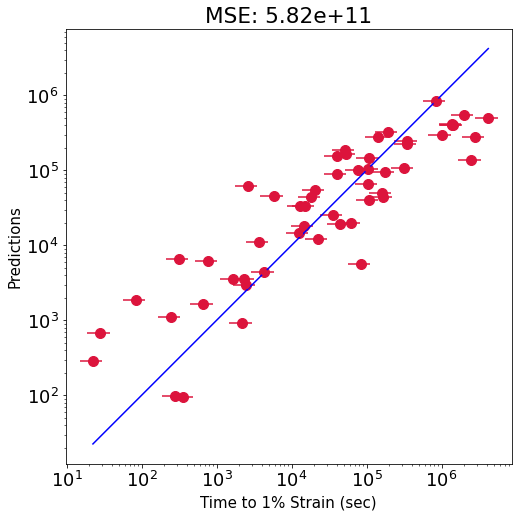

r2_score = 
0.12914731105172383
MSElist = [582370836928.4883]
random state list = [0]


In [69]:
#To show 1 plot, use plot_randomstates(1, True, False)
#To show full 99 seeds, use plot_randomstates(100, False, True)

plot_randomstates(1, True, False)
#plot_randomstates(100, plot_MSE=False, plot_variance=True)

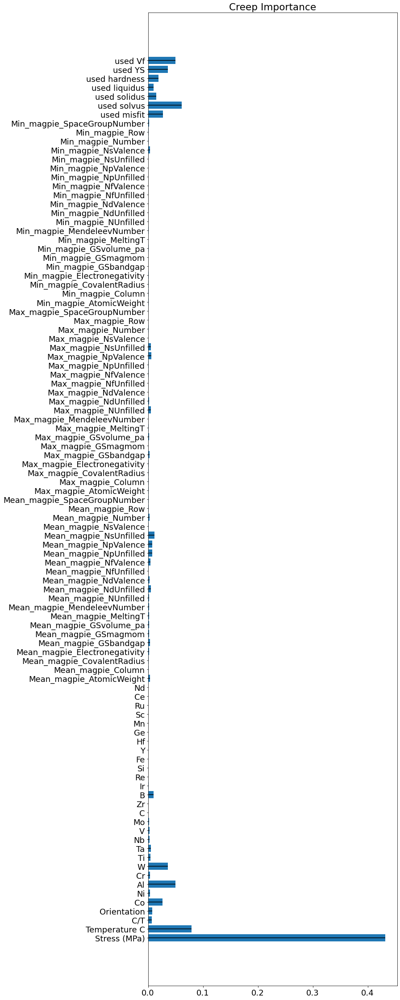

seed: 0 | MSE: 5.82e+11


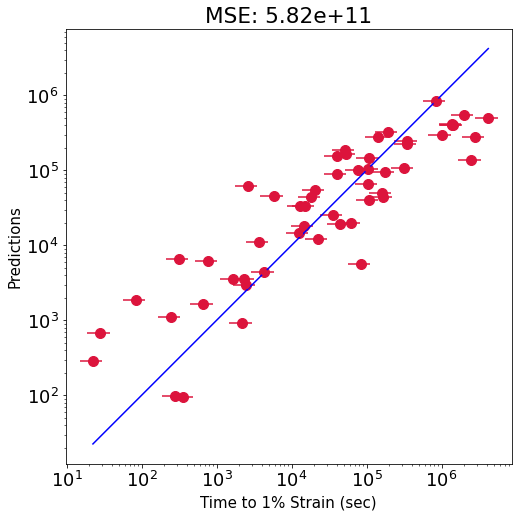

5.82e+11
MSE: 5.82e+11


In [51]:
#assign new_prediction to be new data, or pd.DataFrame (makes empty dataframe) if testing the fit
MSE, Y_pred, Y_test, X_test = predict_creep_life(input_df=data, 
                                                 new_prediction = pd.DataFrame(),
                                                 plot_histogram = False,
                                                 random_state1=0, 
                                                 random_state2=0, 
                                                 random_state3=0, 
                                                 n_clusters = 1, 
                                                 elbowplot=False, 
                                                 plot_importance = True, 
                                                 plotresult=True)

#Run this after a single run from the previous function, to see more detailed graph
df_results = X_test
#print(X_test)
#print(df)
#print("now df_results")
#print(df_results)

df_results['shortname']= df['Shortname']
df_results['Stress (MPa)']= df['Stress (MPa)']
df_results['temperature C']= df['Temperature C']
df_results['Y_pred'] = Y_pred
df_results['Y_test'] = Y_test
#print(df_results)

pd.set_option("display.max_rows", None, "display.max_columns", None)
print('{:.2e}'.format(MSE))

print(f"MSE: {'{:.2e}'.format(MSE)}")
fig = px.scatter(df_results, x= "Y_test", y="Y_pred", color = "cluster_label", hover_name = "shortname",
                 hover_data = [
                     "Stress (MPa)",
                     "temperature C"
                 ],
                 log_x=True, log_y=True)

fig.update_traces(marker=dict(size=15,
                              line=dict(width=2,)),
                  selector=dict(mode='markers'))




fig.add_trace(
    go.Scatter(
        y=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
        x=[max(max(Y_pred), max(Y_test)),min(min(Y_pred), min(Y_test))],
        mode="lines",
        line=go.scatter.Line(color="red"),
        showlegend=False)
)

#Confirmation that seed 0, k = 5 perfectly matches with old program!

In [52]:
#MSElist for k=1
#MSElist = [534738259419.40125, 565639557228.281, 222951190541.09836, 908082631902.2915, 832646623162.8993, 7888567880368.005, 14640812532549.191, 174515951870.79703, 798962814815.3619, 167084319284.67664, 209316697867.53027, 408031853628.23517, 1129975686944.6973, 1435066689089.8877, 6501115723617.67, 1074819116981.4241, 14137847105814.598, 7690610678694.382, 442753257187.7632, 241962314307.88834, 467565963826.0266, 399778762922.3534, 147077063314.28586, 953658640201.917, 223325158229.08942, 8094715328145.279, 157346233390.73117, 312207670473.6835, 196026856935.57034, 130249308496.70514, 336637034924.47876, 7875207271829.756, 6783324931036.866, 1302684145798.76, 366519604275.6437, 6841094927127.96, 148188289039.97815, 110658770686.67152, 87231142051.72469, 966134961076.4916, 140869805359.9646, 7271597910101.09, 351332255462.4729, 633421108351.7821, 311319428460.69574, 1885736927069.7197, 605555027994.4518, 1693340955563.3896, 1573688153969.5295, 66489031310.61388, 232475122032.13464, 6763730440405.073, 562108468170.5063, 1698845279836.0737, 885198270662.5741, 692364234987.4469, 351094316822.2811, 2604881430642.6714, 7673429031057.056, 6979639716086.024, 7666124090589.524, 1824343948147.4412, 7486230978016.285, 2425157683045.4854, 241201484521.56082, 401786453800.76495, 328365765104.0375, 523656713047.9628, 8182424459075.893, 421348949213.30963, 330646680945.8509, 33815960988.514847, 415738003942.887, 9673140298357.43, 452539967952.18604, 514788508464.91724, 1833763783376.6846, 14108050652351.734, 7098483509551.741, 361714929920.6527, 1637831383914.5798, 184786859206.65134, 7435413312457.173, 7048159529480.258, 430609585271.4528, 398950592899.81635, 224600324527.83295, 385828188731.5067, 85611858392.15775, 501957894062.1694, 7999430176617.864, 1663983853337.467, 8191306583531.745, 565375491136.1774, 390221469129.091, 415002165136.43634, 7733298418629.531, 217271774084.13007, 317080021949.1772, 127853980533.46124]

#MSElist for k=2
#MSElist = [629153725643.0503, 565088297177.596, 225052838907.96796, 896578071643.8611, 841564945231.1119, 7917702162590.044, 14835275964936.812, 164589438233.24927, 815707270514.2284, 179041906799.12866, 214372550549.41693, 416053504135.462, 1104353176198.1245, 1489230887056.3787, 6682424308050.87, 1093054424077.0486, 14191329366774.146, 7822541673302.509, 434828547058.00024, 245067107490.38132, 455541880341.05164, 379896571909.50964, 150042710650.80478, 982097395340.4518, 224082363757.7189, 8258587093659.975, 166024683180.1185, 328784562402.44934, 223344266262.5266, 119884756786.86243, 323437477906.45685, 7889248901706.851, 6935900499818.394, 1281343935136.1028, 409391481274.23956, 6863496389710.221, 131428316221.87364, 137696307026.42752, 72834744766.82523, 1040222008734.9846, 153985781366.65176, 7338819151363.664, 462480646249.1888, 636143357296.3038, 324015155172.0866, 1900896178286.8418, 557615551968.9905, 1703160010405.3645, 1543904170327.231, 98694941496.09045, 234732341330.93842, 6853483953976.349, 647972773055.3737, 1686881362624.053, 891730531724.299, 737456475304.635, 362554385021.5761, 2602937509830.717, 7725128457958.431, 6988244580711.978, 7736388035110.586, 1920789002224.927, 7614282909618.502, 2461606907490.42, 233150915467.0017, 396624047700.80505, 324724959892.056, 640440334258.354, 8299296125257.499, 394814867559.83215, 329730543231.1406, 41949189114.879234, 404497217797.0319, 9802227673097.264, 521504662606.1721, 524603333821.67786, 1815031555423.7893, 14249580702548.154, 7166102472191.956, 375059219276.1786, 1646195377093.1487, 209554344787.91608, 7542168127123.433, 7077002300618.377, 436130208434.7116, 504897626282.437, 221928994224.8406, 378605048589.9296, 83050831421.7535, 538399926622.36566, 8090413567064.005, 1694033188003.82, 8254663831165.704, 564142389741.9065, 398888634108.027, 452168928008.4514, 7772607228335.717, 237975954203.04105, 317322966377.3347, 131679339084.82698]

#MSElist for k=3
#MSElist = [634196855857.3181, 568482995335.9464, 198746964387.55164, 890225073067.5938, 838335849574.9202, 7914345335410.386, 14823701646953.57, 152176371931.93295, 728940333357.9248, 184047468250.0523, 224523963245.67554, 418066338751.7522, 1103230458983.4482, 1564447599898.3655, 6710786239241.118, 1050518898855.5421, 14220176976291.953, 7822742812173.912, 453597772350.9441, 256285194902.06802, 456625125912.2568, 378100179231.2324, 154620875279.70944, 1102104494041.0928, 223265891447.8195, 8262724763415.386, 172435291685.8975, 320549173294.2003, 212795285986.05023, 118512824624.865, 317950724942.3476, 7926102467001.086, 6971742301280.373, 1275166797013.3152, 413459373506.6987, 6896173639752.537, 122250527123.63254, 128864034893.4244, 77684591094.18063, 1052190501418.5264, 148369704506.42786, 7351665322184.633, 462416664547.7862, 634834632169.9819, 324757621708.1613, 1892001810938.2473, 564912669587.5697, 1703038726897.0535, 1545216143527.7854, 112723589462.08792, 225472571007.33926, 6885414385644.017, 607143992387.4707, 1684447942391.539, 961296515428.9377, 734482077335.3273, 280403070339.074, 2603347419670.677, 7726806899008.236, 6998089414272.252, 7763444889609.567, 1922163703437.3064, 7612579603185.523, 2459625819188.179, 233525453787.49393, 393619949629.16364, 304431480003.2248, 634027913560.2845, 8178134965148.512, 378496798634.57355, 320663450470.5376, 39509063037.631386, 430891089341.31647, 9804987801780.172, 520501378317.4573, 532858844242.98773, 1820350018208.6775, 14257859468430.879, 7191980591509.498, 377736816206.94446, 1644876287323.1172, 196038736769.51804, 7539323345110.307, 7085428739955.692, 439273188408.67334, 335658168905.1343, 255715735919.5039, 380910828664.4191, 83308120922.69043, 541811858919.6099, 8094682642163.014, 1700476252570.944, 8243164244358.191, 567109768207.5171, 400315187426.4004, 450653080302.6318, 7813842614366.375, 238681069152.8379, 322566759560.63983, 141041482731.97778]

#MSElist for k=4
#MSElist = [560929766863.2955, 567491400859.374, 229365339180.43124, 896378027524.6942, 850142894462.9683, 8029026187614.36, 14883978049562.16, 183801828099.6486, 764266211207.8752, 163654866195.48737, 226200943411.1859, 415106323034.09296, 1111532638014.959, 1504413521923.6072, 6770125334107.686, 1093992718093.5234, 14223410479052.447, 7869538448795.083, 424086800991.741, 249436857059.34485, 492948026136.80786, 536177993834.7114, 154678807523.35678, 969559459889.2178, 223172955661.17404, 8298403432492.772, 164870157031.0613, 332319245296.7633, 212430740630.95407, 118228468357.59627, 340431829608.0738, 7992212504006.095, 6895584282541.379, 1384657829536.2012, 406270337976.45233, 6886462604271.073, 115781446793.41754, 77239403705.65117, 80754434064.67775, 1049301822004.0294, 158602293863.036, 7359116930706.936, 313553491042.61615, 636648387711.7412, 333568269357.8634, 1896134171209.8594, 521882910079.1672, 1699468730833.9714, 1536935154893.7324, 90079697745.87766, 235254590444.87262, 6864409620860.554, 647467674026.6427, 1691987503737.1865, 893509370633.8524, 706271381374.6362, 343084008127.7978, 2608910812025.187, 7724561236872.914, 7030411538848.83, 7766022685798.581, 1791762869203.872, 7469710264844.081, 2237348173290.4966, 241150303919.0761, 403626737705.80066, 325760004095.12866, 495860073260.9023, 8185212475483.345, 358908043788.3769, 326882480453.7016, 57414499440.94569, 404010170427.5618, 9673715107903.94, 335946932833.7859, 539818033417.3441, 1806991656911.5142, 14180388968245.143, 7254578518204.693, 385864618007.32837, 1637396716438.7312, 174641628121.79745, 7422762085642.856, 7092129465727.857, 463183914266.1325, 400416470611.5237, 181047888408.9298, 401292532715.9807, 91785225943.62834, 491622666671.7852, 7999497147023.237, 1681967505632.9014, 8302943510223.152, 572246242927.6652, 406387167945.5707, 428326370481.7275, 7987640751599.852, 212891218723.57703, 322065433097.4749, 185412968617.01028]

#MSElist for k=5
#MSElist = [520552223684.8035, 567421560962.0476, 204311699138.35483, 847733729136.9197, 848995487165.2174, 7933676118380.405, 14936717364596.227, 149743251989.85434, 806099663736.6852, 191972250984.04382, 230118690829.98853, 437698886832.37213, 1116079379752.3657, 1510222439145.2266, 6789558196997.205, 1106889517050.828, 14323875440758.83, 7782180503925.292, 416515134581.9266, 274702639730.5375, 504417105606.2884, 393716649472.1831, 156814811990.90875, 1059047070852.9037, 224742183511.9927, 8418948715978.813, 179654141622.55255, 318188253327.28687, 226860446904.91022, 91362290316.3751, 391487660038.0749, 8001317517995.333, 6940602801543.417, 1366318885157.6248, 420826036917.8423, 6934466840368.511, 114213393285.63985, 62921187662.436455, 86713236462.03102, 1056309824327.1227, 173778164657.0734, 7382009569256.424, 380688230059.1245, 664643926017.2643, 321349736522.1036, 1877567448025.5002, 550426343019.1615, 1707655014755.7996, 1532004402032.8442, 119904219159.07814, 245227181187.94147, 6995943878021.746, 598530547549.633, 1706925041311.5923, 892107297859.9617, 746514677677.5177, 340540839734.70966, 2709565242476.647, 7701534778986.993, 7034781948602.45, 7863540813686.311, 1800602677887.695, 7487678462361.707, 2435402202352.1147, 229282382117.23807, 400572553691.09143, 329652937841.8875, 603567915741.7853, 8206555589456.694, 366985402153.8097, 329250090310.68976, 48151004094.551094, 400478002407.5739, 9717740650683.502, 486583294347.0351, 539269550191.5476, 1805710277329.9495, 14378732787308.898, 7250513058516.6875, 388357616529.2909, 1646917808640.2842, 212918249884.7342, 7471877058970.375, 7147880550332.759, 461780120490.63446, 449796889307.7504, 182573814579.81915, 389084423474.423, 79406212859.74657, 499374700965.28876, 7948985660367.304, 1666320947813.887, 8389100379287.932, 594982061948.7186, 371345828746.58844, 429420051430.18665, 7957586345716.782, 235305475591.37427, 337931935502.01184, 134691498499.88821]

#MSElist for k=6
#MSElist = [617061762782.3181, 561636358476.7448, 236679830422.2346, 851741592845.8851, 847697925011.1622, 7995250329611.401, 14870179125217.445, 140153742763.41937, 805250154661.2144, 168468557102.8873, 225786691452.06635, 447663652936.2768, 1128551294733.9963, 1557225434296.3975, 6624301269269.702, 1130319397898.312, 14369515425677.74, 7739232014201.787, 344612490629.12164, 262934937707.4262, 498598104504.60504, 395752450016.16437, 166829448366.3705, 1069854489240.6007, 228104047442.30737, 8321374021746.543, 173022185004.64758, 304743207782.79193, 236616488597.2526, 133933961245.81956, 473898962804.20026, 7946075189853.97, 6845641580639.417, 1378801604984.3691, 407103085360.56305, 6920083407421.377, 126979323124.1577, 62815263635.06694, 79754076725.90352, 1002042848504.3209, 207182537649.65897, 7409163561676.23, 439938157567.8476, 670619420228.8802, 299383844960.76074, 1893488800356.5056, 597355375383.2026, 1712724222390.1323, 1576202711911.8357, 127383092646.6698, 246050601625.74762, 6920746699670.625, 621804315549.9099, 1672917422678.7126, 962464578093.8092, 717935566103.9764, 344393263882.45044, 2712362781668.201, 7720167146817.721, 7056933578343.842, 7943534918571.538, 1677091731629.924, 7461884078895.636, 2422718448762.3525, 222454674611.79575, 406376459860.88434, 328922555847.4939, 453866924729.4667, 8317514554330.531, 368468779574.4316, 326021567414.5069, 45301342143.32827, 414739108794.60034, 9751595580449.96, 489467526393.1099, 539115698569.8906, 1760696450543.2231, 14185441456764.104, 7239837982965.12, 393488033221.8847, 1644422056679.3755, 209694051461.67004, 7460534979848.513, 7098186710498.712, 447585413164.6653, 485479924928.42505, 199285462550.0851, 401466425816.44025, 88941789003.9303, 576584420170.6365, 8035749677342.589, 1510431427974.872, 8355479205312.563, 614486147367.5953, 401210295125.0015, 428306245680.9273, 7940493325582.739, 232997063123.55786, 341209503721.06714, 119915189568.14735]

#MSElist for k=7
#MSElist = [591438879472.1171, 565224110715.376, 246323848173.84695, 849601606318.395, 845849366818.2351, 7929386686679.101, 14793768980508.377, 173491345485.93637, 805310770828.0089, 164290543795.17883, 220925754954.31598, 432038937189.8148, 1161697874878.4863, 1466412513357.788, 6727218298110.901, 1136217177496.3762, 14195718253922.758, 7676541287828.664, 344838474844.3763, 355692707861.2906, 507311052836.9921, 402959438205.83325, 167585659015.56653, 1071305878405.5239, 231475444847.32663, 8229116662333.009, 173635137542.44037, 326242802095.9492, 250435740517.52844, 132164950466.18352, 473365519069.493, 7913258661374.512, 6911435618195.465, 1354385015681.119, 406670899204.67175, 6889191324977.305, 131957983405.388, 65803770988.3648, 237005424911.72208, 1016530204415.3446, 176944573028.3567, 7407265388143.181, 318468348694.3295, 671636896020.1921, 301647763672.10474, 1887432060801.8376, 599781796073.468, 1699453947134.7214, 1571662144082.7505, 116709313976.88838, 219818631941.3898, 6934036053791.384, 577015215752.5835, 1693333973342.013, 961525754892.8813, 707343454394.203, 309498597461.68634, 2694156058034.063, 7703086423427.152, 6993868250233.765, 7903264260675.161, 1919602094725.0613, 7618681496768.813, 2423599852830.6836, 240209712602.41782, 403131491275.19763, 348510911370.02386, 459087040416.777, 8235425832770.048, 390367404952.6992, 325415493290.17114, 43894375880.18145, 410916432134.4085, 9633998918139.316, 474000370934.64343, 558024666779.0092, 1771637006778.6191, 14326385910990.975, 7212523957653.224, 391238597605.35535, 1669024356553.3606, 199317585012.75632, 7404789942496.795, 7055625750428.6045, 435798402945.4116, 356622702388.79736, 185186310481.9937, 401907595644.15265, 97054830405.83038, 502912702874.75494, 7953421790405.992, 1615150035506.455, 8230893610719.033, 554294718661.087, 393217694172.2626, 426558833290.4169, 7978351616315.805, 212683137721.14786, 337784457122.8858, 128525006732.67162]



In [53]:
#Old Database MSElists

#MSElist for k=1
#MSElist = [2339601983463.0264, 592734055519.1545, 711909294103.3906, 339704009387.9856, 286580822011.48706, 601736961590.6033, 2403654927578.407, 699728774100.6694, 481216200975.4486, 123570723237.4426, 1392598686709.8516, 967358702507.0277, 5893213789.695723, 445358910936.8193, 11051714679632.229, 525011185688.78735, 237313620072.87527, 501758252953.1726, 22283647065520.742, 75387431915.36108, 375832724535.51385, 865935204555.429, 3316580911104.991, 65929161036.51624, 788183543778.6891, 1549476348558.0422, 240928039554.22653, 11460616214887.895, 267953474721.92206, 10596448692355.273, 97614439168.99722, 487207865549.60956, 410605021087.6711, 478308946004.074, 12144567307259.826, 317393239267.8995, 186223393718.69016, 82667563156.5965, 1292124864510.4934, 1120722080735.388, 154768016060.2424, 682484633583.645, 657562893549.5706, 501170565086.45984, 533698434709.83386, 11804095024827.08, 476225357736.94025, 10817566664832.56, 10634746627970.53, 60154029722.116394, 29353447444.46961, 13089125578450.242, 1072233431426.7445, 922140315637.4009, 77746579328.31367, 1309710647114.8962, 189852489159.27612, 28805024599.22769, 10607843094941.293, 286472700903.3096, 240313679417.24097, 282223283436.90436, 1104922471307.0178, 330461898046.0064, 290612479887.7925, 11794613639884.736, 189251471481.60425, 11399728237490.281, 451952578064.45544, 654693420936.6407, 239518597092.3755, 156921423320.98648, 176281693805.81442, 11482521707754.328, 442054439663.3183, 263805531035.07825, 451080861477.7109, 264182742946.7825, 101164675327.95264, 503551502851.7965, 296767063038.8172, 376862706624.41125, 434911231163.6876, 2230635242479.9443, 375224067868.69836, 13027824119355.502, 640711803867.1573, 181481846843.59113, 109080826463.01047, 422263864262.68726, 11989625763271.963, 436318502111.7378, 1312350317020.316, 265470055472.58185, 232340846976.41983, 11270852661983.168, 59253595060.24836, 117091676745.1192, 821670431171.2325, 75444702721.80403]

#MSElist for k=2
#MSElist = [2181485334161.6406, 629578761937.1189, 954071187777.7736, 370499312828.4289, 291355426733.3566, 650661462113.2368, 2325472517469.1445, 717882071537.7767, 511500657097.38025, 123818210290.70744, 1332049792353.2402, 1080663835095.9888, 3812553048.640744, 460188645475.1019, 11124065855136.857, 773274869027.9487, 284195767225.9337, 601505427974.7494, 22274349306610.703, 100995709119.06805, 438014471343.3625, 900815991882.2892, 3229271442886.9307, 73561397594.7197, 847052617944.0908, 1531047068252.949, 472215065688.73944, 11410755765821.701, 336696989796.0337, 10801745529640.201, 126435340746.06863, 335227836703.562, 486763943618.32227, 506861428556.2882, 12236727435157.89, 317674268670.4089, 279851180229.42096, 84163491297.88887, 1308509191200.693, 1149125271784.5317, 184309064938.96606, 733277763363.6132, 1544880960079.127, 664523683208.4371, 544017292830.02185, 11946606842264.197, 523126425872.0863, 11008184415386.928, 10753139508712.836, 85388418712.70227, 41297990879.77864, 13176197014814.984, 1096072962085.3398, 998661313360.7715, 180632082130.47183, 1309617225222.0684, 197477435006.58014, 30704073116.19069, 10775824720337.873, 225531202784.6439, 279034397038.1094, 282169292984.5344, 1112671742927.851, 337102811949.36957, 1285146455489.3948, 11686616191410.887, 204176052768.5491, 11641619258675.826, 461303307748.538, 692670430433.3701, 255161791193.57147, 194336038205.7819, 234285248894.2395, 11613762675590.936, 513858931338.17645, 291227513614.98975, 484706717148.11066, 280811663143.73694, 140686276821.85938, 591432894667.0137, 298130280506.9918, 399608917989.3105, 492572258836.6022, 2265242742046.645, 496758587878.0795, 13291439869542.791, 839936141131.2234, 204289560353.1222, 138720920581.77695, 467906952300.33185, 12167981452289.367, 583286066261.0493, 1471607808340.3315, 339996138833.4065, 245789878874.5413, 11360575732857.238, 69706653154.70268, 160807922053.7105, 978778637411.0615, 85318294891.39383]

#MSElist for k=3
#MSElist = [2293898729613.121, 637700381693.3757, 755627786713.2168, 376562689813.62506, 281005250021.7816, 649742395484.7408, 2456163854978.4644, 849540805788.4988, 483430088054.2872, 123038838181.45331, 1330485709961.7476, 1223407947131.3083, 4300205653.651389, 420449308727.4816, 11067902615396.783, 691932160794.2272, 290051056499.2075, 492065338185.5181, 22276970802020.574, 86401129056.88354, 415773812879.57, 904869161074.1727, 3127835640890.797, 73154119823.5353, 802265788236.3884, 1595520273005.1467, 420489090749.7932, 11411363350557.74, 334449911218.17255, 10747339413957.42, 155785701363.16962, 358396254861.66846, 430460934069.997, 466646012682.54395, 11669607404554.238, 321020789271.7393, 279338692647.7211, 78599544573.19695, 1283857531806.7676, 1062341878154.4563, 184350116304.7858, 662218650409.2178, 682692840347.0107, 730800916159.5905, 506864897520.0195, 11739244152913.123, 330139002521.2915, 11007857030211.182, 10588128154843.178, 54709031836.18373, 40852206087.16061, 12856080880341.377, 1088041326351.9641, 986817860933.4906, 229344739901.4844, 1312463405156.9358, 219726539048.64117, 32658540550.106194, 10783297124004.018, 224448279721.46768, 231750485033.47473, 272604712954.4595, 1077526234466.3564, 331556097778.03894, 1120843249271.5078, 11619325903451.213, 188507784580.32144, 11574366725128.123, 486614669089.53467, 695499612608.6416, 259515438134.0378, 175379911973.84604, 206588162314.91464, 11611170514811.297, 479849059112.54175, 286828142351.3104, 482873940243.8181, 277901115710.01105, 138494450883.60297, 603581007161.0177, 302959756067.2413, 301873354272.48816, 586867186945.492, 2345053801025.3516, 488340257064.75024, 13352842179407.715, 775322915243.6842, 142243068040.9256, 140945221099.40118, 468629567194.1349, 12092539118111.166, 415359913457.0669, 1311777515526.0298, 333291054363.1039, 255631339266.34415, 11394527205276.982, 65970177739.95537, 133694057578.71324, 816688559392.8363, 97412672357.71353]

#MSElist for k=4
#MSElist = [2235445447120.823, 615288860680.3687, 839083928046.6924, 369051026742.6277, 296143623843.1042, 644355175727.9745, 2284355095332.631, 778984747933.5103, 497926262520.7107, 124523702426.21107, 1326436452525.2239, 1288644465769.1384, 4508343405.818457, 418667447506.9408, 11144594140860.248, 700028184068.6155, 283841047610.79114, 379373055166.5899, 22235458442346.58, 82987030693.76382, 396985542211.93365, 895438041051.723, 3230439917335.0435, 73273316281.27705, 806993523886.484, 1536411585052.4167, 415754747487.1592, 11579366833060.469, 332996055918.6992, 10836452197504.648, 167034328538.83875, 346517392120.3302, 478681773428.57855, 455236428265.26855, 12538718692787.664, 299547782460.3638, 338280025262.99036, 84782860010.8647, 1329364056408.0752, 1148367108452.0017, 211088076343.11795, 702938424963.4248, 1355909530520.2502, 713436800699.5681, 666687703686.7761, 12215158339379.059, 541037317145.8372, 11026475729636.664, 10738689996430.44, 53428149373.82458, 41440345728.23056, 13234222520809.887, 1090977487024.4448, 952189373552.177, 217079041617.5311, 1306882486518.497, 194105986279.6438, 32213666536.09395, 10799848252326.346, 245850337587.89453, 307867960500.52936, 284655899792.8921, 1108600016604.2837, 343079946758.2122, 1159658365405.3152, 11998078612288.195, 201725730850.635, 11703063148681.697, 463730286018.8678, 661833926679.1234, 248141473310.2955, 176516207658.47787, 241758094486.96756, 11416948758390.367, 518964316342.74036, 268552479161.6258, 485039231386.32556, 256405386059.4252, 137978571004.69702, 686627625080.0792, 300000644760.5115, 449768501570.2705, 431791513672.87427, 2337093432696.408, 432578147909.77625, 13389778579417.277, 954240955897.7262, 183885632993.24594, 138265036087.23486, 385694848277.28955, 12111998403180.527, 481971321412.43646, 1495196227892.0366, 307702715758.73145, 254355702742.2401, 11363820437742.283, 74213724754.70677, 131133078567.36417, 1013294580606.5963, 86910254366.12292]

#MSElist for k=5
#MSElist = [2188037600115.9307, 613614007462.2587, 963572908991.6372, 394988192703.61566, 285474283227.1743, 604917764446.8215, 2308979501580.0664, 686598474665.9584, 516286096544.8667, 123578496337.61584, 1421647175336.8813, 1270002256553.4329, 4085125895.931093, 485343847191.42145, 11112146431019.71, 636859725609.0524, 248722203871.6228, 382759029865.79004, 22274989889433.15, 68088389893.843796, 385001730418.48883, 873274225558.1484, 3229098130120.301, 88289866328.84627, 776519828645.1721, 1619489105095.8677, 249759983495.68274, 11396818194568.537, 388592842107.50397, 10826840087123.451, 171055539385.16586, 304929749511.1031, 469281061517.1161, 490419761886.85565, 11846139422618.205, 298717183035.38385, 309812526274.2749, 93877387178.8814, 1321268892050.324, 1077171175109.7438, 194431202525.76514, 653907894532.6277, 1071154239512.369, 612423011695.8306, 646431066009.2927, 11811670007824.05, 413519014257.63025, 11019266443724.729, 10623331606857.986, 54957931656.5246, 43069347616.52684, 13236734799169.975, 1224540350350.2136, 1028633612767.7354, 252977595132.5418, 1374718034286.141, 217052888609.78473, 34580432455.41069, 10779519786214.807, 217264026035.11005, 164188375625.92645, 275091060494.4565, 1062294936471.2336, 339375184355.31067, 1622730246099.6892, 12120148861617.107, 190931951257.3905, 11736089753248.566, 450453119470.2935, 653770636967.7461, 250335110457.4021, 173246352509.7102, 246876009686.07516, 11675882752186.543, 492000677509.7722, 266474441678.43515, 474785893083.6996, 255354317854.87448, 127524279682.20418, 694729017574.1178, 327623094788.5028, 470801026045.43274, 654996689395.6573, 2363955813942.375, 368134311279.5322, 13301196543204.408, 619572869458.0361, 111940354869.39975, 149491269696.72424, 569535871890.2318, 12065142425647.74, 462010211932.25665, 1260516685818.8533, 318281666953.8373, 246901796267.0203, 11343050653057.715, 101188620917.39995, 125802247187.839, 858776472928.5769, 86084338809.68044]

#MSElist for k=6
#MSElist = [2316038858739.542, 614350674609.1826, 843607735704.1514, 395051606287.0689, 281783025747.65076, 604613167949.9012, 2274940482758.1436, 704724659523.8596, 523915721313.99976, 127866629510.85483, 1422763388606.9229, 1072693183508.6315, 5355965368.906803, 438920710742.7877, 11075925719902.766, 709076473130.0999, 247263502959.8001, 297857105321.8319, 22746220419158.47, 77512661034.01974, 414899433712.2318, 896717575643.6163, 3290145845986.7583, 89138735221.41443, 850784705346.3333, 1632008747667.2073, 213016538593.80023, 11558942554440.508, 440750558041.3475, 10762173282045.205, 170827812398.2172, 212907865686.32776, 475683985462.6485, 445754076781.21094, 11792576051643.527, 284080008269.64276, 115863454180.0389, 84043689071.45853, 1331205862160.4478, 1101816513804.5903, 216480106517.20834, 648090040464.5375, 1033394029035.9849, 655731232074.2148, 635322337782.9854, 11933280478605.713, 467678307948.08405, 10741496802842.361, 10757251438827.7, 49768008816.510994, 46394816447.907814, 13294789012632.248, 1220309626157.324, 1094829098671.6748, 233447896785.281, 1409532105760.496, 226259937158.76953, 19465941563.219067, 10795264594382.953, 276341652786.4348, 246902188509.61752, 278860153422.33276, 1122351952976.3809, 347891809595.71063, 246441001119.30377, 11622305160827.14, 187481917762.42828, 11654116148722.857, 449183417805.4649, 646125179059.8555, 176181901635.16235, 170072591915.03876, 194488426991.58224, 11516097877274.139, 465218047590.128, 271010698250.3041, 474365940276.75616, 259631027708.11765, 130723247279.19281, 393027210984.77344, 420688142001.8643, 294862693281.68823, 450977835573.68097, 2195663213254.416, 542920297982.5672, 13154443102692.076, 568797546397.6248, 126156617969.37311, 127253620532.6095, 277496090719.47473, 11986421028055.64, 600208072115.2146, 1275756830736.0566, 324587684800.5267, 245110357864.05972, 11346829856099.492, 74040287954.17818, 156924567427.3504, 976706898268.7554, 92781617951.6463]

#MSElist for k=7
#MSElist = [2181821249026.9375, 586363448836.1919, 912335583406.8397, 388064853588.19464, 281823899666.01514, 597202127935.3514, 2357133263373.68, 535582049821.80225, 528699301280.4221, 125636335213.21495, 1448158230732.2769, 1309343706781.0662, 5106075835.091714, 512386397714.86456, 11139113638019.48, 738212348498.4877, 253059587953.7256, 254936894926.55072, 22329830514796.04, 68625618256.5299, 386236347464.854, 906609364202.5391, 2946481903936.4336, 91663495935.56262, 662180061871.3062, 1618052034946.8022, 326896037266.32666, 11382569284867.797, 388949744163.40564, 10773701885063.66, 138230117263.57974, 575423191230.1866, 468669240408.95593, 431583489264.482, 12669353676100.777, 306412276045.7268, 591203692819.6656, 93250319289.69121, 1347237898197.691, 1166032169285.2954, 174114383606.37256, 693296727866.442, 2038942049039.8633, 313894810290.55914, 342093809947.3689, 12319658143543.55, 527326199541.19025, 11044372030645.25, 10572513128786.783, 78482842640.0401, 54403809102.95842, 13322305812557.771, 1223775698183.415, 1214185322103.4739, 245897553974.464, 1451267947484.566, 219522856754.85492, 30818921733.38063, 10719471756229.023, 258445973356.19818, 517554385084.5516, 282980590304.8982, 1105272178071.1477, 332162665312.70325, 1822706771156.7783, 11697511465524.088, 182444663925.01855, 11543446379640.064, 412838059949.26697, 644858929559.4578, 45101304537.79562, 166078889042.26486, 246915019539.08917, 11852155894180.162, 466909321685.92523, 255315719859.22076, 480164038280.39496, 252364744592.8818, 136838240254.84235, 411669521262.6639, 307022692104.4782, 400446283480.9857, 618135156099.7761, 2159095664339.461, 327368206231.3927, 13168179928622.453, 873527432297.8522, 115737656852.01645, 140340659135.72568, 301523081451.3991, 12101901148790.814, 536707616114.65753, 1544444335032.171, 324366942664.22296, 256213834280.84506, 11349214261403.332, 97603894732.8401, 164493127330.10522, 1078885086526.4777, 111817730146.79662]




In [54]:
# newcomp_df=pd.read_csv('new_prediction_composition.csv', encoding='ANSI')
# newcomp_df= newcomp_df.fillna(0)
# magpie_names = get_chem_only_descriptors(formula=newcomp_df.Shortname[0], source="magpie")[1]
# newcomp_df[magpie_names] = [get_chem_only_descriptors(formula=i, source="magpie")[0] for i in newcomp_df['Shortname']]

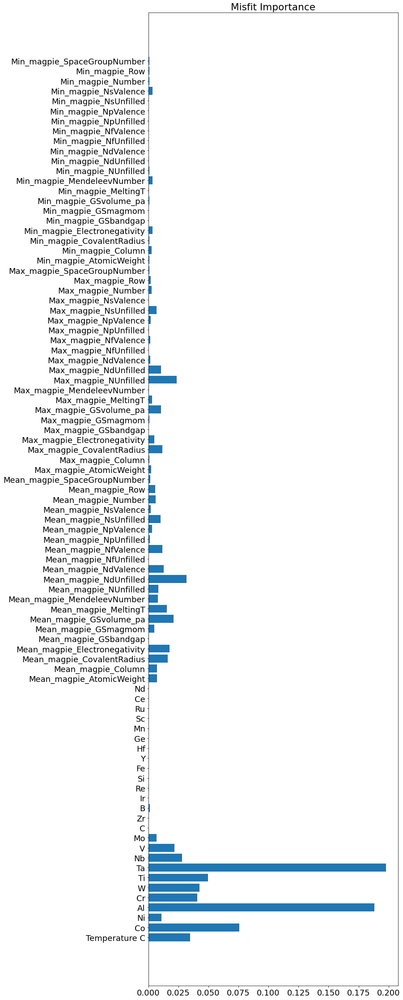

In [55]:
#generates misfit data, it is important for test_fit and plot_fit to be False, so that 100% training data is used
new_misfit_prediction = predict_ML_misfit(input_df = newcomp_df,
                              misfit_file='ML-Co-input_lattice misfit.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

newcomp_df['ML misfit']= new_misfit_prediction
#newcomp_df['used misfit']=newcomp_df['misfit'].fillna(data['ML misfit'])
newcomp_df['used misfit']= new_misfit_prediction

In [56]:
print(newcomp_df[['Shortname', 'used misfit']])
#Result is actually very close! ML range 0.0046-0.003. Actual range is about 0.0055-0.0035

                                             Shortname  used misfit
0     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
1     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
2     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
3     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
4     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
5     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
6     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
7     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
8     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B     0.004662
9    Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0...     0.004675
10   Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0...     0.004675
11   Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0...     0.004675
12   Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0...     0.004675
13   Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1

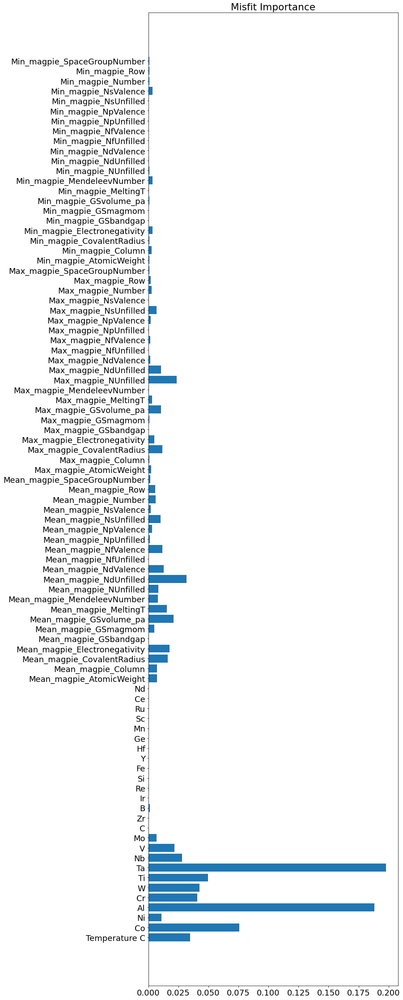

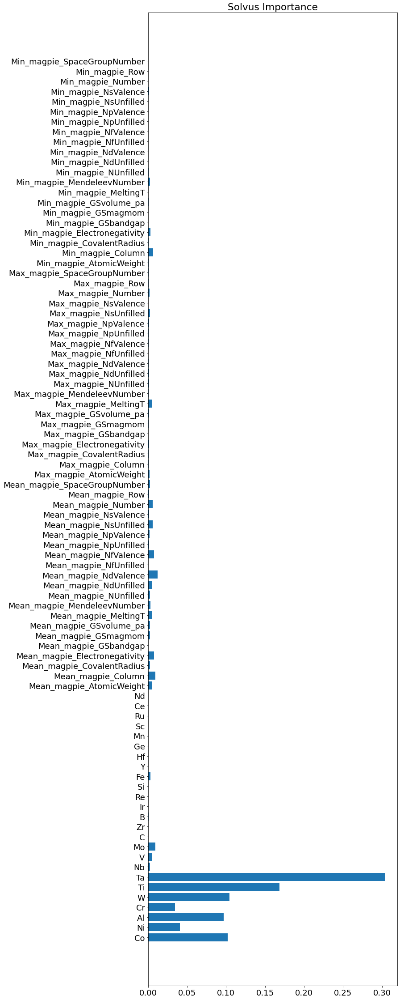

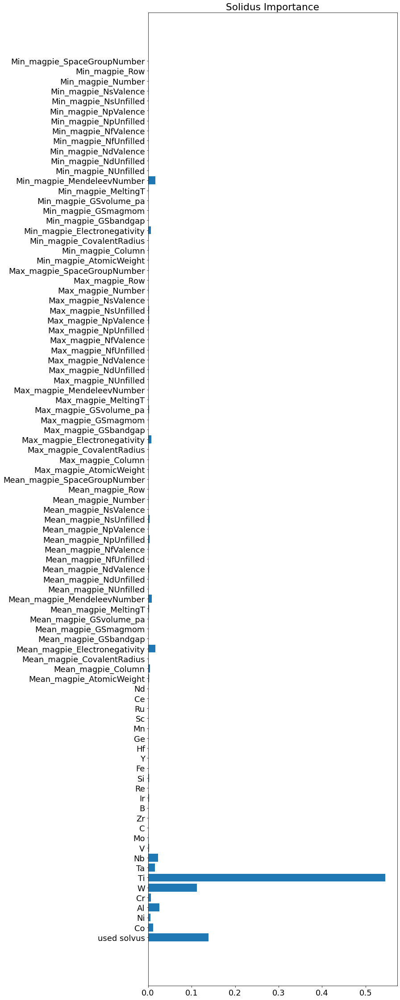

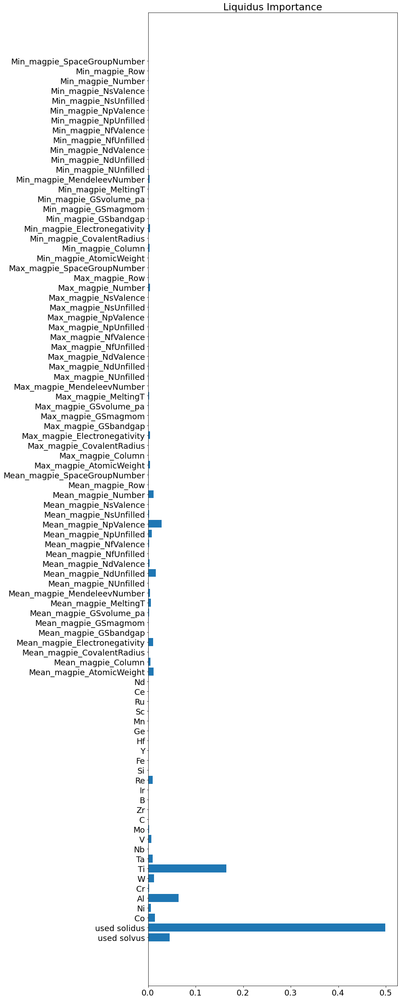

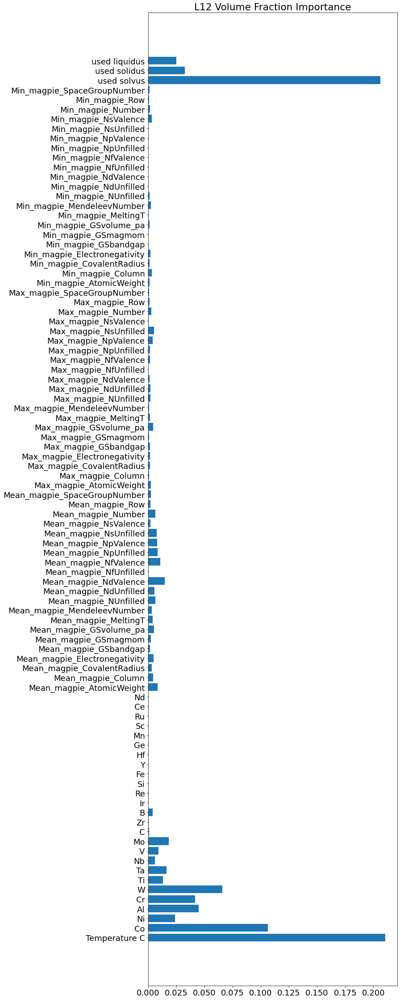

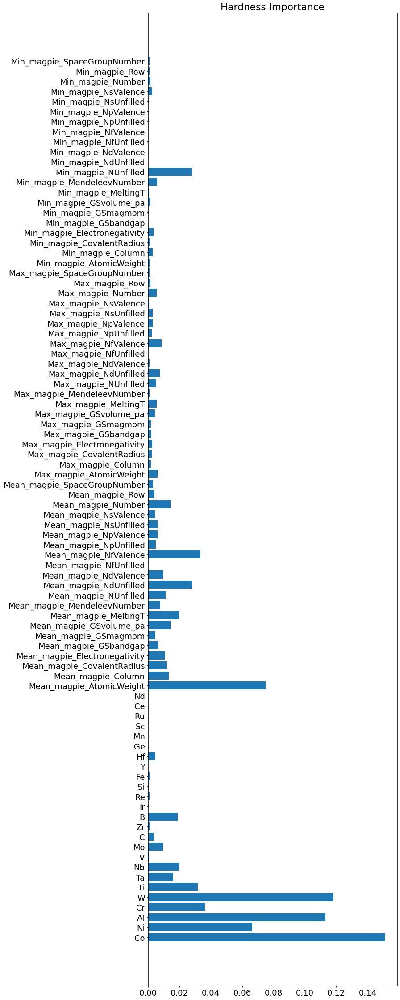

C:\Users\brand\anaconda3\lib\site-packages\pandas\core\reshape\merge.py:1205: UserWarning:

You are merging on int and float columns where the float values are not equal to their int representation.



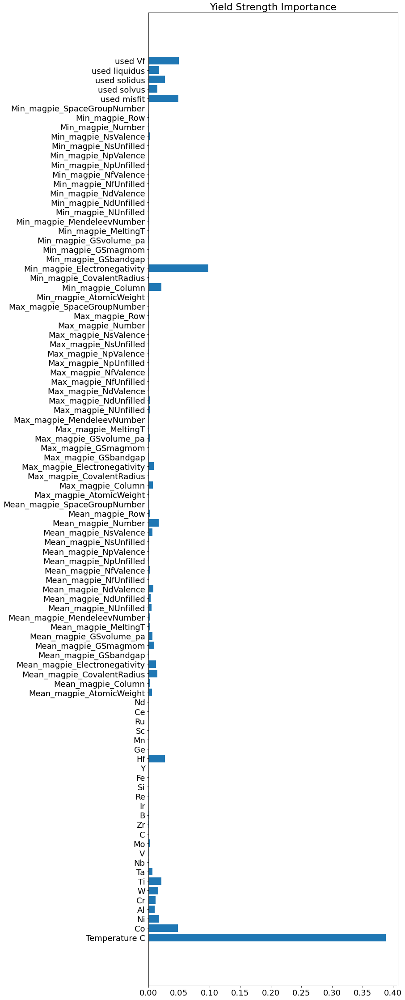

In [70]:
new_misfit_prediction = predict_ML_misfit(input_df = newcomp_df,
                              misfit_file='ML-Co-input_lattice misfit.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

newcomp_df['ML misfit']= new_misfit_prediction
newcomp_df['used misfit']=newcomp_df['misfit'].fillna(newcomp_df['ML misfit'])
#newcomp_df['used misfit']= new_misfit_prediction

new_solvus_prediction = predict_ML_solvus(input_df = newcomp_df,
                              raw_file='ML-Co-input_solvus_only.csv',
                              plot_histogram=False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

newcomp_df['ML solvus']= new_solvus_prediction
newcomp_df['used solvus']=newcomp_df['solvus'].fillna(newcomp_df['ML solvus'])
#newcomp_df['used solvus']= new_solvus_prediction


new_solidus_prediction = predict_ML_solidus(input_df = newcomp_df,
                              raw_file='ML-Co-input_solidus_only.csv',
                              plot_histogram = False,
                              test_fit=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

newcomp_df['ML solidus']= new_solidus_prediction
newcomp_df['used solidus']=newcomp_df['solidus'].fillna(newcomp_df['ML solidus'])
#newcomp_df['used solidus']= new_solidus_prediction


new_liquidus_prediction = predict_ML_liquidus(input_df = newcomp_df,
                              raw_file='ML-Co-input_liquidus_only.csv',
                              test_fit=False,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

newcomp_df['ML liquidus']= new_liquidus_prediction
newcomp_df['used liquidus']=newcomp_df['liquidus'].fillna(newcomp_df['ML liquidus'])
#newcomp_df['used liquidus']= new_liquidus_prediction


new_Vf_prediction = predict_ML_Vf(input_df = newcomp_df,
                              raw_file='ML-Co-input_Vf.csv',
                              test_fit=False,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

newcomp_df['ML Vf']= new_Vf_prediction
newcomp_df['used Vf']=newcomp_df['Vf'].fillna(newcomp_df['ML Vf'])
#newcomp_df['used Vf']= new_Vf_prediction


new_hardness_prediction = predict_ML_hardness(input_df = newcomp_df,
                              raw_file='ML-Co-input_hardness.csv',
                              test_fit=False,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

newcomp_df['ML hardness']= new_hardness_prediction
newcomp_df['used hardness']=newcomp_df['hardness'].fillna(newcomp_df['ML hardness'])
#newcomp_df['used hardness']= new_hardness_prediction


new_YS_prediction = predict_ML_YS(input_df = newcomp_df,
                              raw_file='ML-Co-input_YS.csv',
                              test_fit=False,
                              plot_histogram=False,
                              plot_fit=False,
                              plot_importance=True,
                              random_state1=0,
                              random_state2=0)

newcomp_df['ML YS']= new_YS_prediction
newcomp_df['used YS']=newcomp_df['YS'].fillna(newcomp_df['ML YS'])
#newcomp_df['used YS']= new_YS_prediction



In [71]:
# print(newcomp_df[['Shortname', 'Temperature C','used misfit','used solvus',
#                   'used solidus','used liquidus', 'used hardness', 'used YS']])
newcomp_df

,Shortname,Temperature C,log(time),Stress (MPa),Sol. Temp (ºC),Sol. Time (h),1 age temp (ºC),1 age time (h),2 age temp (ºC),2 age time (hr),C/T,Orientation,VolFrac (%),Co,Ni,Al,Cr,W,Ti,Ta,Nb,V,Mo,C,Zr,B,Ir,Re,Si,Fe,Y,Hf,Ge,Mn,Sc,Ru,Ce,Nd,misfit,solvus,solidus,liquidus,Vf,hardness,YS,Mean_magpie_AtomicWeight,Mean_magpie_Column,Mean_magpie_CovalentRadius,Mean_magpie_Electronegativity,Mean_magpie_GSbandgap,Mean_magpie_GSmagmom,Mean_magpie_GSvolume_pa,Mean_magpie_MeltingT,Mean_magpie_MendeleevNumber,Mean_magpie_NUnfilled,Mean_magpie_NdUnfilled,Mean_magpie_NdValence,Mean_magpie_NfUnfilled,Mean_magpie_NfValence,Mean_magpie_NpUnfilled,Mean_magpie_NpValence,Mean_magpie_NsUnfilled,Mean_magpie_NsValence,Mean_magpie_Number,Mean_magpie_Row,Mean_magpie_SpaceGroupNumber,Max_magpie_AtomicWeight,Max_magpie_Column,Max_magpie_CovalentRadius,Max_magpie_Electronegativity,Max_magpie_GSbandgap,Max_magpie_GSmagmom,Max_magpie_GSvolume_pa,Max_magpie_MeltingT,Max_magpie_MendeleevNumber,Max_magpie_NUnfilled,Max_magpie_NdUnfilled,Max_magpie_NdValence,Max_magpie_NfUnfilled,Max_magpie_NfValence,Max_magpie_NpUnfilled,Max_magpie_NpValence,Max_magpie_NsUnfilled,Max_magpie_NsValence,Max_magpie_Number,Max_magpie_Row,Max_magpie_SpaceGroupNumber,Min_magpie_AtomicWeight,Min_magpie_Column,Min_magpie_CovalentRadius,Min_magpie_Electronegativity,Min_magpie_GSbandgap,Min_magpie_GSmagmom,Min_magpie_GSvolume_pa,Min_magpie_MeltingT,Min_magpie_MendeleevNumber,Min_magpie_NUnfilled,Min_magpie_NdUnfilled,Min_magpie_NdValence,Min_magpie_NfUnfilled,Min_magpie_NfValence,Min_magpie_NpUnfilled,Min_magpie_NpValence,Min_magpie_NsUnfilled,Min_magpie_NsValence,Min_magpie_Number,Min_magpie_Row,Min_magpie_SpaceGroupNumber,ML misfit,used misfit,ML solvus,used solvus,ML solidus,used solidus,ML liquidus,used liquidus,ML Vf,used Vf,ML hardness,used hardness,ML YS,used YS
0,Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B,850,5.568636,215.00,1200,48,850,168,0.0,0.0,1,10,32.0,73.03,9.74,4.98,4.15,0.0,2.04,1.59,1.37,3.02,0,0,0,0.08,0,0,0,0.00,0,0,0,0,0,0,0,0,NaN,970,1387,1425,32.0,405.230000,NaN,7.161457,0.864198,15.320988,0.189753,0.018815,0.026468,1.498858,236.067531,6.135802,0.617284,0.469136,0.395062,0.0,0.172840,0.123457,0.024691,0.024691,0.197531,3.160494,0.444444,23.703704,20.105320,1.444444,18.888889,0.226667,0.169333,0.172052,2.020000,365.555556,8.111111,0.888889,0.888889,0.888889,0.0,1.555556,0.555556,0.111111,0.111111,0.222222,8.111111,0.666667,25.444444,1.201222,0.444444,9.333333,0.166667,0.0,0.0,0.796944,103.718889,4.777778,0.222222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111111,0.555556,0.222222,18.444444,0.004662,0.004662,1010.360443,970,1332.519221,1387,1422.459194,1425,46.552970,32.0,370.626277,405.230000,596.925574,596.925574
1,Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B,850,5.308035,239.20,1200,48,850,168,0.0,0.0,1,10,32.0,73.03,9.74,4.98,4.15,0.0,2.04,1.59,1.37,3.02,0,0,0,0.08,0,0,0,0.00,0,0,0,0,0,0,0,0,NaN,970,1387,1425,32.0,405.230000,NaN,7.161457,0.864198,15.320988,0.189753,0.018815,0.026468,1.498858,236.067531,6.135802,0.617284,0.469136,0.395062,0.0,0.172840,0.123457,0.024691,0.024691,0.197531,3.160494,0.444444,23.703704,20.105320,1.444444,18.888889,0.226667,0.169333,0.172052,2.020000,365.555556,8.111111,0.888889,0.888889,0.888889,0.0,1.555556,0.555556,0.111111,0.111111,0.222222,8.111111,0.666667,25.444444,1.201222,0.444444,9.333333,0.166667,0.0,0.0,0.796944,103.718889,4.777778,0.222222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.111111,0.555556,0.222222,18.444444,0.004662,0.004662,1010.360443,970,1332.519221,1387,1422.459194,1425,46.552970,32.0,370.626277,405.230000,596.925574,596.925574
2,Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B,850,4.887730,265.00,1200,48,850,168,0.0,0.0,1,10,32.0,73.03,9.74,4.98,4.15,0.0,2.04,1.59,1.37,3.02,0,0,0,0.08,0,0,0,0.00,0,0,0,0,0,0,0,0,NaN,970,1387,1425,32.0,405.230000,NaN,7.161457,0.864198,15.320988,0.189753,0.018815,0.026468,1.498858,236.067531,6.135802,0.617284,0.469136,0.395062,0.0,0.172840,0.123457,0.024691,0.024691,0.197531,3.160494,0.444444,23.

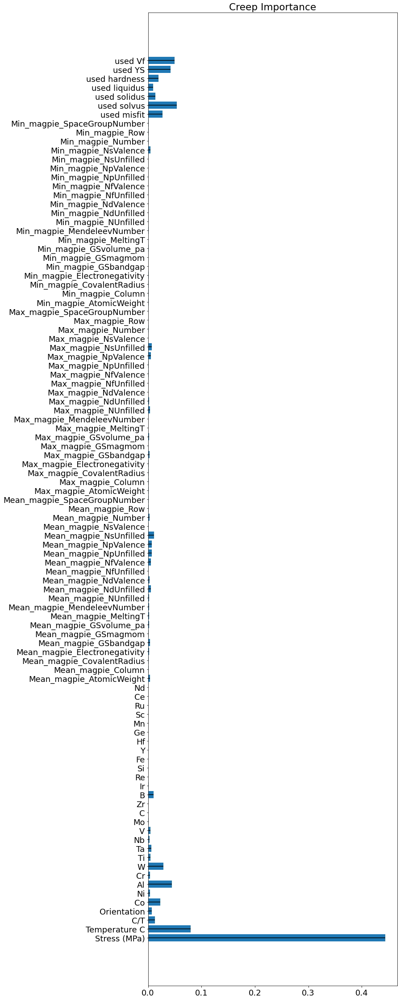

seed: 0 | MSE: 1.65e+10


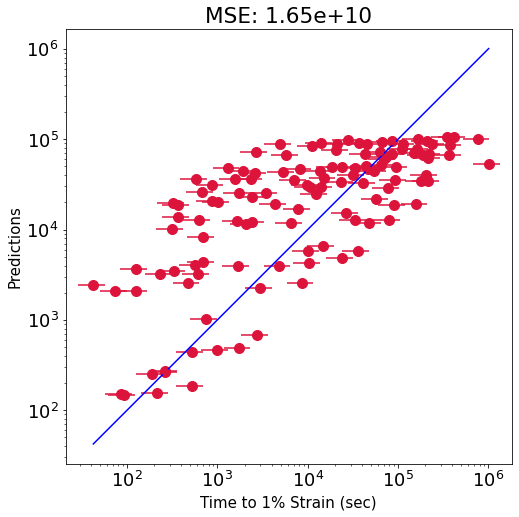

r2_score = 
0.12005091640065135


In [72]:
MSE, new_creep_pred, Y_test, X_test = predict_creep_life(input_df=data, 
                                                 new_prediction = newcomp_df,
                                                 plot_histogram = False,
                                                 random_state1=0, 
                                                 random_state2=0, 
                                                 random_state3=0, 
                                                 n_clusters = 1, 
                                                 elbowplot=False, 
                                                 plot_importance = True, 
                                                 plotresult=True)

In [73]:
newcomp_df['ML creep time']= new_creep_pred
newcomp_df.to_csv('newcomp_prediction.csv', index=False)

In [74]:
print(list(newcomp_df.columns))

['Shortname', 'Temperature C', 'log(time)', 'Stress (MPa)', 'Sol. Temp (ºC)', 'Sol. Time (h)', '1 age temp (ºC)', '1 age time (h)', '2 age temp (ºC)', '2 age time (hr)', 'C/T', 'Orientation', 'VolFrac (%)', 'Co', 'Ni', 'Al', 'Cr', 'W', 'Ti', 'Ta', 'Nb', 'V', 'Mo', 'C', 'Zr', 'B', 'Ir', 'Re', 'Si', 'Fe', 'Y', 'Hf', 'Ge', 'Mn', 'Sc', 'Ru', 'Ce', 'Nd', 'misfit', 'solvus', 'solidus', 'liquidus', 'Vf', 'hardness', 'YS', 'Mean_magpie_AtomicWeight', 'Mean_magpie_Column', 'Mean_magpie_CovalentRadius', 'Mean_magpie_Electronegativity', 'Mean_magpie_GSbandgap', 'Mean_magpie_GSmagmom', 'Mean_magpie_GSvolume_pa', 'Mean_magpie_MeltingT', 'Mean_magpie_MendeleevNumber', 'Mean_magpie_NUnfilled', 'Mean_magpie_NdUnfilled', 'Mean_magpie_NdValence', 'Mean_magpie_NfUnfilled', 'Mean_magpie_NfValence', 'Mean_magpie_NpUnfilled', 'Mean_magpie_NpValence', 'Mean_magpie_NsUnfilled', 'Mean_magpie_NsValence', 'Mean_magpie_Number', 'Mean_magpie_Row', 'Mean_magpie_SpaceGroupNumber', 'Max_magpie_AtomicWeight', 'Max_mag

In [75]:
plotcomp_df = newcomp_df.copy()[['Shortname', 'Temperature C', 'log(time)', 'Stress (MPa)','ML YS','cluster_label','ML creep time']]
print(plotcomp_df)

                                             Shortname  Temperature C  \
0     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
1     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
2     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
3     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
4     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
5     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
6     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
7     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
8     Co-9.7Ni-5.Al-4.2Cr-2.0Ti-1.6Ta-1.4Nb-3.0V-0.08B            850   
9    Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0...            850   
10   Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0...            850   
11   Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0...            850   
12   Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0

Shortname
Co-11.8Ni-18.3Fe-5.5Al-4.1Cr-2.1Ti-1.5Ta-1.5Nb-3.1V-0.08B    AxesSubplot(0.125,0.125;0.775x0.755)
Co-11.8Ni-18.3Fe-5.5Al-8.3Cr-2.0Ti-1.4Ta-1.4Nb-3.1V-0.08B    AxesSubplot(0.125,0.125;0.775x0.755)
Co-15.5Ni-14.3Fe-5.6Al-4.2Cr-2.1Ti-1.5Ta-1.5Nb-3.1V-0.08B    AxesSubplot(0.125,0.125;0.775x0.755)
Co-15.6Ni-14.2Fe-5.4Al-8.3Cr-2.1Ti-1.5Ta-1.5Nb-3.1V-0.08B    AxesSubplot(0.125,0.125;0.775x0.755)
Co-17.4Ni-12.2Fe-5.4Al-8.3Cr-2.1Ti-1.6Ta-1.5Nb-3.1V-0.08B    AxesSubplot(0.125,0.125;0.775x0.755)
Co-17.5Ni-12.4Fe-5.4Al-4.2Cr-2.0Ti-1.5Ta-1.4Nb-3.1V-0.08B    AxesSubplot(0.125,0.125;0.775x0.755)
Co-19.4Ni-5.1Al-4.1Cr-2.1Ti-1.6Ta-1.4Nb-3.1V-0.08B           AxesSubplot(0.125,0.125;0.775x0.755)
Co-19.5Ni-5.Al-8.3Cr-2.1Ti-1.6Ta-1.4Nb-3.0V-0.08B            AxesSubplot(0.125,0.125;0.775x0.755)
Co-29.2Ni-11.1Al-4.2Cr-5.8W                                  AxesSubplot(0.125,0.125;0.775x0.755)
Co-29.2Ni-4.1Fe-10.9Al-4.1Cr-5.8W                            AxesSubplot(0.125,0.125;0.775x0.755)
Co-29.3Ni-

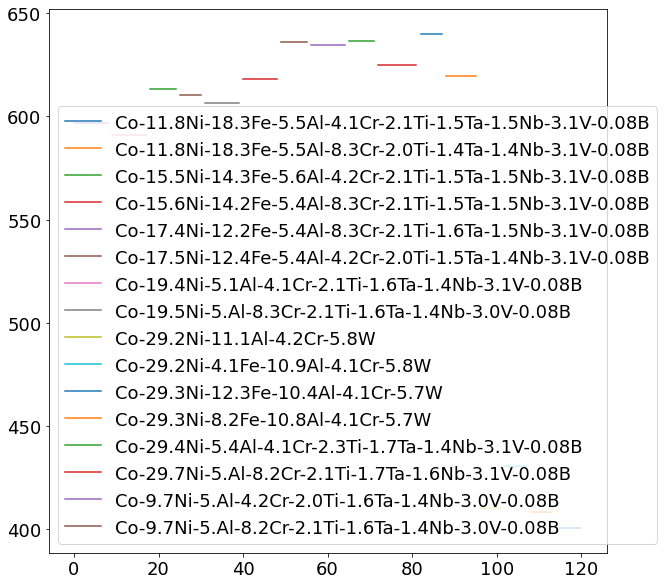

In [76]:
#print(plotcomp_df)

#define index column (once per run, then comment out)
#plotcomp_df.set_index('Temperature C', inplace=True)

plt.rcParams['figure.figsize'] = [10, 10]


fig = plotcomp_df.groupby('Shortname')['ML YS']
fig.plot(legend=True)

